# Fase 1: Entendimiento del negocio

##Contexto

Aerostáticos Aventura es una empresa que ofrece viajes en globos aerostáticos en diversas localizaciones. Para asegurar la seguridad y satisfacción de sus clientes, la empresa ha decidido implementar un sistema avanzado de análisis de datos para predecir las condiciones climáticas y optimizar la planificación de los vuelos.

##Problema

La empresa ha experimentado un aumento en las cancelaciones de vuelos debido a condiciones climáticas adversas, lo cual ha tenido varios impactos negativos en el negocio, perdidas de ingreso, insatisfacción del cliente y costos operativos adicionales. Las posibles causas son los pronósticos inexactos del clima en tiempo real, la ausencia de herramientas para anticipar estas condiciones metereológicas adversas y la dependencia de decisiones manuales e inexactas por parte de los miembros de la empresa.

##Objetivo del proyecto

El objetivo principal del proyecto es desarrollar un modelo de predicción que permita a Aerostáticos Aventura:

1) Predecir las condiciones climáticas con alta precisión.

2) Identificar los mejores horarios y rutas para los vuelos.

3) Mejorar la experiencia del cliente y minimizar riesgos relacionados con el clima.

##Requisitos del proyecto

- Organización de un equipo calificado para el despliegue de la solución.
- Herramientas tecnológicas necesarias para el cumplimiento de objetivos.

##Supuestos del proyecto

- Disponibilidad y fiabilidad de los datos de los datos.
- Adopción de los contenidos por parte del personal.

##Restricciones del proyecto

- El plazo del proyecto es de 6 meses
- El presupuesto del proyecto es de $240.000.000(doscientos cuarenta millones de pesos chilenos)


#Fase 2: Conocimiento de los datos


## Carga de librerías


In [ ]:
%matplotlib inline

!pip install wquantiles
!python -m pip install statsmodels


import matplotlib
matplotlib.axes.Axes.boxplot
matplotlib.pyplot.boxplot
import pandas as pd
import numpy as np
from scipy import stats
import seaborn as sns
import matplotlib.pylab as plt
from statsmodels.robust import mad
from scipy.stats import trim_mean
from statsmodels import robust
from pathlib import Path
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score
import plotly.express as px
from scipy.stats import zscore

##Carga de datos

In [ ]:
from google.colab import files
uploaded = files.upload()
for fn in uploaded.keys():
  name = fn
df=pd.read_csv('weatherAUS.csv', sep=",")

Saving weatherAUS.csv to weatherAUS.csv


##Renombrar los nombres de las columnas a minúscula.

Este apartado facilitará el manejo práctica de los datos en los siguientes códigos.

In [ ]:
df.columns = pd.DataFrame(df.columns)[0].apply(lambda x : x.lower()).values
df.columns

Index(['date', 'location', 'mintemp', 'maxtemp', 'rainfall', 'evaporation',
       'sunshine', 'windgustdir', 'windgustspeed', 'winddir9am', 'winddir3pm',
       'windspeed9am', 'windspeed3pm', 'humidity9am', 'humidity3pm',
       'pressure9am', 'pressure3pm', 'cloud9am', 'cloud3pm', 'temp9am',
       'temp3pm', 'raintoday', 'risk_mm', 'raintomorrow'],
      dtype='object')

##Cantidad de información y columnas


In [ ]:
print("Hay {0} observaciones, considerando {1} variables".format(df.shape[0], df.shape[1]))

Hay 142193 observaciones, considerando 24 variables


## Vista previa a los datos


In [ ]:
df.head()

,date,location,mintemp,maxtemp,rainfall,evaporation,sunshine,windgustdir,windgustspeed,winddir9am,...,humidity3pm,pressure9am,pressure3pm,cloud9am,cloud3pm,temp9am,temp3pm,raintoday,risk_mm,raintomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0.0,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0.0,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,0.0,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,1.0,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No


In [ ]:
valores_unicos = df['windgustspeed'].unique()
print(valores_unicos)

[ 44.  46.  24.  41.  56.  50.  35.  80.  28.  30.  31.  61.  22.  63.
  43.  26.  33.  57.  48.  39.  37.  52.  98.  54.  83.  nan  59.  70.
  69.  17.  20.  19.  15.  13.  11.  72.  85.  65.  78. 107.  74.  67.
  94.  76.  81.  87.   9.   7.  89.  91.  93. 102. 100. 113. 117.  96.
 111. 106. 135. 104. 120. 115. 126. 109. 122. 124. 130.   6.]


##Identificación de variables

Se identifican los nombres de las variables, y se separan estas en dos grupos, Las variables cualitativas no pueden medirse en términos numéricos, como categorías o características. Las variables cuantitativas pueden medirse numéricamente, como la cantidad de elementos de un conjunto y aplicar operaciones aritméticas en estas mismas.


In [ ]:
print("-----------------------------------------")
print("Cantidad de variables cuantitativas :", len(df.describe().columns.values))
print("-----------------------------------------")
print("Variables cuantitativas :", df.describe().columns.values)
print("-----------------------------------------")
print("Cantidad de variables cualitativas :", len(df.describe(include=object).columns.values))
print("-----------------------------------------")
print("Variables cualitativas :", df.describe(include=object).columns.values)


-----------------------------------------
Cantidad de variables cuantitativas : 17
-----------------------------------------
Variables cuantitativas : ['mintemp' 'maxtemp' 'rainfall' 'evaporation' 'sunshine' 'windgustspeed'
 'windspeed9am' 'windspeed3pm' 'humidity9am' 'humidity3pm' 'pressure9am'
 'pressure3pm' 'cloud9am' 'cloud3pm' 'temp9am' 'temp3pm' 'risk_mm']
-----------------------------------------
Cantidad de variables cualitativas : 7
-----------------------------------------
Variables cualitativas : ['date' 'location' 'windgustdir' 'winddir9am' 'winddir3pm' 'raintoday'
 'raintomorrow']


El codigo indica que existen 17 variables cuantitativas y 7 cualitativas. Sin embargo, se debe tener en cuenta que 'Cloud9am' (nubosidad de las 9AM) y 'Cloud3pm' (nubosidad de las 3PM), tienen valores como números que indican una clasificación, en este caso del nivel de nubosidad.

En el ejemplo, se evidencian 10 valores de nubosidad a las 9AM, 'cloud9am' y 'cloud3pm' son variables cualitativas. Por lo tanto, hay 15 variables cuantitativas y 9 variables cualitativas.

In [ ]:
import pandas as pd


variables_cuantitativas = ['date', 'location', 'mintemp', 'maxtemp', 'rainfall', 'evaporation',
       'sunshine', 'windgustdir', 'windgustspeed', 'winddir9am', 'winddir3pm',
       'windspeed9am', 'windspeed3pm', 'humidity9am', 'humidity3pm',
       'pressure9am', 'pressure3pm', 'cloud9am', 'cloud3pm', 'temp9am',
       'temp3pm', 'raintoday', 'risk_mm', 'raintomorrow']

valores_unicos_cuantitativas = {}
for var in variables_cuantitativas:
    valores_unicos_cuantitativas[var] = df[var].unique()

variables_cualitativas = ['date', 'location', 'windgustdir', 'winddir9am', 'winddir3pm', 'raintoday', 'raintomorrow']

valores_unicos_cualitativas = {}
for var in variables_cualitativas:
    valores_unicos_cualitativas[var] = df[var].unique()

print("Valores únicos de variables cuantitativas:")
print("========================================")
for var, valores in valores_unicos_cuantitativas.items():
    print(f"{var}: {valores}")

print("\nCantidad de variables cualitativas:", len(variables_cualitativas))
print("=====================================")

print("\nValores únicos de variables cualitativas:")
print("========================================")
for var, valores in valores_unicos_cualitativas.items():
    print(f"{var}: {valores}")


Valores únicos de variables cuantitativas:
date: ['2008-12-01' '2008-12-02' '2008-12-03' ... '2008-01-29' '2008-01-30'
 '2008-01-31']
location: ['Albury' 'BadgerysCreek' 'Cobar' 'CoffsHarbour' 'Moree' 'Newcastle'
 'NorahHead' 'NorfolkIsland' 'Penrith' 'Richmond' 'Sydney' 'SydneyAirport'
 'WaggaWagga' 'Williamtown' 'Wollongong' 'Canberra' 'Tuggeranong'
 'MountGinini' 'Ballarat' 'Bendigo' 'Sale' 'MelbourneAirport' 'Melbourne'
 'Mildura' 'Nhil' 'Portland' 'Watsonia' 'Dartmoor' 'Brisbane' 'Cairns'
 'GoldCoast' 'Townsville' 'Adelaide' 'MountGambier' 'Nuriootpa' 'Woomera'
 'Albany' 'Witchcliffe' 'PearceRAAF' 'PerthAirport' 'Perth' 'SalmonGums'
 'Walpole' 'Hobart' 'Launceston' 'AliceSprings' 'Darwin' 'Katherine'
 'Uluru']
mintemp: [13.4  7.4 12.9  9.2 17.5 14.6 14.3  7.7  9.7 13.1 15.9 12.6  9.8 14.1
 13.5 11.2 11.5 17.1 20.5 15.3 16.2 16.9 20.1 19.7 12.5 12.  11.3  9.6
 10.5 12.3 13.7 16.1 14.  17.  17.3 17.2 17.4 19.8 14.9 13.9 18.6 19.3
 24.4 18.8 20.8 15.7 18.5 20.4 21.8 22.3 22.  28.  21

## Estadística descriptiva

La estadística descriptiva permite cuantificar la realidad de los datos y disponer de sus elementos para su posterior análisis.

Los tres enfoque de estudios sobre los datos son los siguientes:

- Medidas de tendencia central
- Frecuencia
- Variabilidad


### Medidas de tendencia cental

####Variables cuantitativas

En este tipo de variables, todas las medidas de tendencia central son relevantes

In [ ]:
print(df['mintemp'].describe())

count    141556.000000
mean         12.186400
std           6.403283
min          -8.500000
25%           7.600000
50%          12.000000
75%          16.800000
max          33.900000
Name: mintemp, dtype: float64


In [ ]:
df['location'].describe()

count       142193
unique          49
top       Canberra
freq          3418
Name: location, dtype: object

In [ ]:
df['maxtemp'].describe()

count    141871.000000
mean         23.226784
std           7.117618
min          -4.800000
25%          17.900000
50%          22.600000
75%          28.200000
max          48.100000
Name: maxtemp, dtype: float64

In [ ]:
df['temp9am'].describe()

count    141289.000000
mean         16.987509
std           6.492838
min          -7.200000
25%          12.300000
50%          16.700000
75%          21.600000
max          40.200000
Name: temp9am, dtype: float64

In [ ]:
df['temp3pm'].describe()

count    139467.000000
mean         21.687235
std           6.937594
min          -5.400000
25%          16.600000
50%          21.100000
75%          26.400000
max          46.700000
Name: temp3pm, dtype: float64

In [ ]:
df['pressure9am'].describe()

count    128179.000000
mean       1017.653758
std           7.105476
min         980.500000
25%        1012.900000
50%        1017.600000
75%        1022.400000
max        1041.000000
Name: pressure9am, dtype: float64

In [ ]:
df['pressure3pm'].describe()

count    128212.000000
mean       1015.258204
std           7.036677
min         977.100000
25%        1010.400000
50%        1015.200000
75%        1020.000000
max        1039.600000
Name: pressure3pm, dtype: float64

In [ ]:
df['windspeed9am'].describe()

count    140845.000000
mean         14.001988
std           8.893337
min           0.000000
25%           7.000000
50%          13.000000
75%          19.000000
max         130.000000
Name: windspeed9am, dtype: float64

In [ ]:
df['windspeed3pm'].describe()

count    139563.000000
mean         18.637576
std           8.803345
min           0.000000
25%          13.000000
50%          19.000000
75%          24.000000
max          87.000000
Name: windspeed3pm, dtype: float64

In [ ]:
df['evaporation'].describe()

count    81350.000000
mean         5.469824
std          4.188537
min          0.000000
25%          2.600000
50%          4.800000
75%          7.400000
max        145.000000
Name: evaporation, dtype: float64

In [ ]:
df['rainfall'].describe()

count    140787.000000
mean          2.349974
std           8.465173
min           0.000000
25%           0.000000
50%           0.000000
75%           0.800000
max         371.000000
Name: rainfall, dtype: float64

In [ ]:
df['windgustspeed'].describe()

count    132923.000000
mean         39.984292
std          13.588801
min           6.000000
25%          31.000000
50%          39.000000
75%          48.000000
max         135.000000
Name: windgustspeed, dtype: float64

In [ ]:
df['humidity9am'].describe()

count    140419.000000
mean         68.843810
std          19.051293
min           0.000000
25%          57.000000
50%          70.000000
75%          83.000000
max         100.000000
Name: humidity9am, dtype: float64

In [ ]:
df['humidity3pm'].describe()

count    138583.000000
mean         51.482606
std          20.797772
min           0.000000
25%          37.000000
50%          52.000000
75%          66.000000
max         100.000000
Name: humidity3pm, dtype: float64

In [ ]:
df['risk_mm'].describe()

count    142193.000000
mean          2.360682
std           8.477969
min           0.000000
25%           0.000000
50%           0.000000
75%           0.800000
max         371.000000
Name: risk_mm, dtype: float64

In [ ]:
df['sunshine'].describe()

count    74377.000000
mean         7.624853
std          3.781525
min          0.000000
25%          4.900000
50%          8.500000
75%         10.600000
max         14.500000
Name: sunshine, dtype: float64

#### Variables cualitativas

La mayoría de variables cualitativas de este set de datos son de la subclasificación nominal.

En las variables cualitativas nominales no existe una agrupación u organización jerarquica inherente. Ergo, las variables, 'date'(fecha), 'location'(ubicación), 'windgustdir'(dirección de la ráfaga de viento), 'winddir9am' (dirección del viento a las 9AM) y 'winddir3pm'(dirección del viento a las 3PM); No necesitan un análisis exhaustivo de sus medidas de tendencia central, salvo la moda, debido a que la información es de carácter futil.

Por otra parte, 'raintomorrow' y 'raintoday' al ser variables binarias con valores de 'Sí' y 'No', poseen una jerarquía de preferencia segun el contexto, lo que las hace variables cualitativas ordinales

Asi mismo, 'cloud9am' y 'cloud3pm', son variables con una categorización clara ascendente del valor '1' hasta el '9'. Ambas siendo variables cualitativas ordinales.

In [ ]:
df['date'].describe()

count         142193
unique          3436
top       2013-12-01
freq              49
Name: date, dtype: object

In [ ]:
df['location'].describe()

count       142193
unique          49
top       Canberra
freq          3418
Name: location, dtype: object

In [ ]:
df['windgustdir'].describe()

count     132863
unique        16
top            W
freq        9780
Name: windgustdir, dtype: object

In [ ]:
df['winddir9am'].describe()

count     132180
unique        16
top            N
freq       11393
Name: winddir9am, dtype: object

In [ ]:
df['winddir3pm'].describe()

count     138415
unique        16
top           SE
freq       10663
Name: winddir3pm, dtype: object

In [ ]:
df['raintoday'].describe()

count     140787
unique         2
top           No
freq      109332
Name: raintoday, dtype: object

In [ ]:
df['raintomorrow'].describe()

count     142193
unique         2
top           No
freq      110316
Name: raintomorrow, dtype: object

In [ ]:
df['cloud9am'].describe()

count    88536.000000
mean         4.437189
std          2.887016
min          0.000000
25%          1.000000
50%          5.000000
75%          7.000000
max          9.000000
Name: cloud9am, dtype: float64

In [ ]:
df['cloud3pm'].describe()

count    85099.000000
mean         4.503167
std          2.720633
min          0.000000
25%          2.000000
50%          5.000000
75%          7.000000
max          9.000000
Name: cloud3pm, dtype: float64

###Frecuencia

La frecuencia indica el número de veces que una variable se repite

####Variables cuantitativas

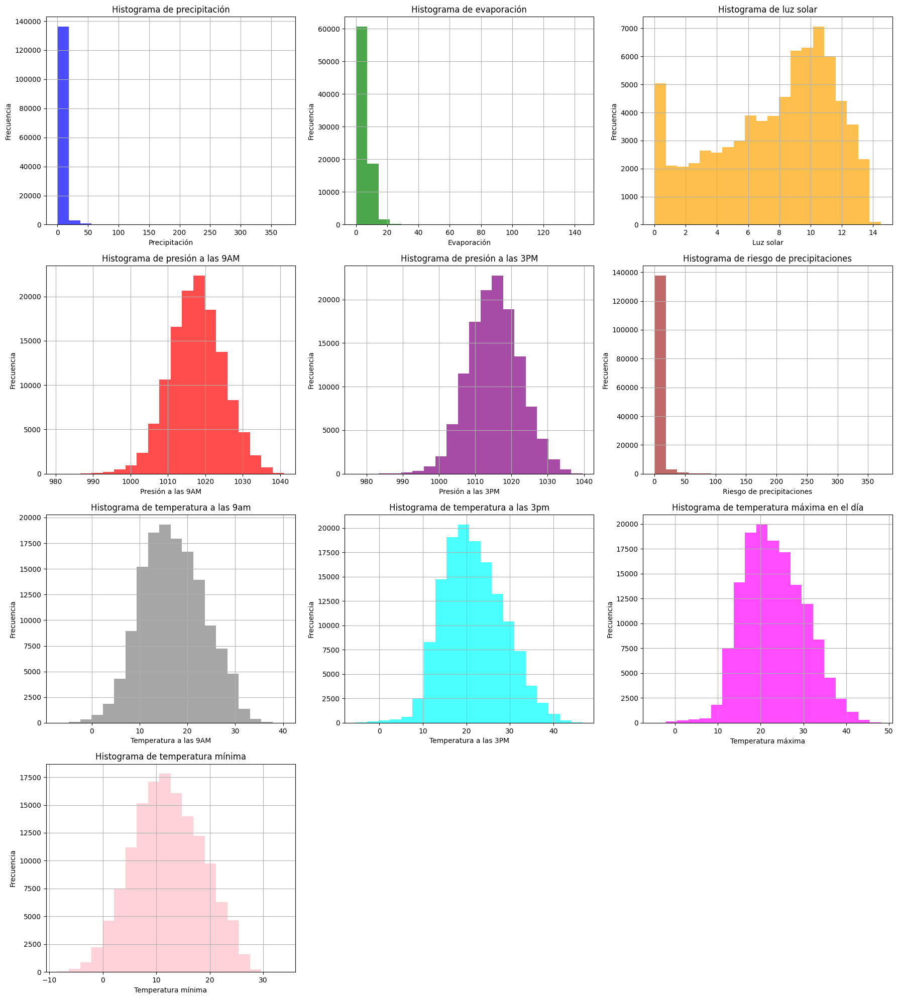

In [ ]:
import matplotlib.pyplot as plt

variables = ['rainfall', 'evaporation', 'sunshine', 'pressure9am', 'pressure3pm', 'risk_mm', 'temp9am', 'temp3pm', 'maxtemp', 'mintemp']
colors = ['blue', 'green', 'orange', 'red', 'purple', 'brown', 'gray', 'cyan', 'magenta', 'pink']
titles = ['Histograma de precipitación', 'Histograma de evaporación', 'Histograma de luz solar',
          'Histograma de presión a las 9AM', 'Histograma de presión a las 3PM', 'Histograma de riesgo de precipitaciones',
          'Histograma de temperatura a las 9am', 'Histograma de temperatura a las 3pm', 'Histograma de temperatura máxima en el día', 'Histograma de temperatura mínima']

# Diccionario de traducción para los nombres de las variables
translations = {
    'rainfall': 'Precipitación',
    'evaporation': 'Evaporación',
    'sunshine': 'Luz solar',
    'pressure9am': 'Presión a las 9AM',
    'pressure3pm': 'Presión a las 3PM',
    'risk_mm': 'Riesgo de precipitaciones',
    'temp9am': 'Temperatura a las 9AM',
    'temp3pm': 'Temperatura a las 3PM',
    'maxtemp': 'Temperatura máxima',
    'mintemp': 'Temperatura mínima'
}

num_plots = len(variables)
cols = 3
rows = (num_plots + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))

for i, (var, color, title) in enumerate(zip(variables, colors, titles)):
    row = i // cols
    col = i % cols
    axes[row, col].hist(df[var], bins=20, color=color, alpha=0.7)
    axes[row, col].set_title(title)
    axes[row, col].set_xlabel(translations[var])
    axes[row, col].set_ylabel('Frecuencia')
    axes[row, col].grid(True)

# Eliminar los ejes vacíos si el número de gráficos no llena la cuadrícula
for j in range(i + 1, rows * cols):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()


Se puede observar que las variables temperatura mínima, temperatura máxima, temperatura a las 3pm, temperatura a las 9am, presión a las 9am, presión a las 3pm, tienen distribuciones que se asemejan al ideal Gaussiano.

La variable de luz solar tiene una asimetría a la derecha, por lo tanto , es asimétrica.

Evaporación, riesgo de precipitaciones y precipitación son variables con un claro sesgo (desbalance), debido a que la mayoría de días no llueve.

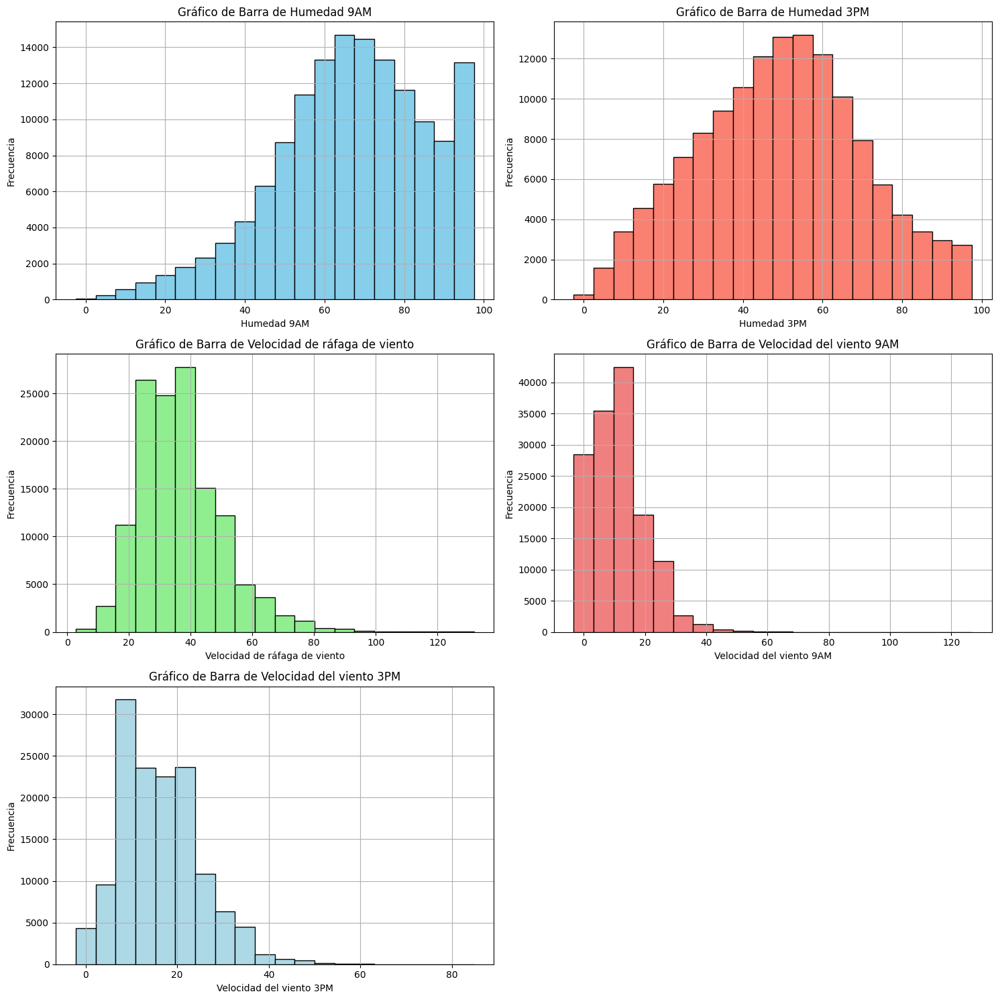

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

variables = ['humidity9am', 'humidity3pm', 'windgustspeed', 'windspeed9am', 'windspeed3pm']
labels = ['Humedad 9AM', 'Humedad 3PM', 'Velocidad de ráfaga de viento', 'Velocidad del viento 9AM', 'Velocidad del viento 3PM']
colors = ['skyblue', 'salmon', 'lightgreen', 'lightcoral', 'lightblue']

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 15))

for i, (var, label, color) in enumerate(zip(variables, labels, colors)):
    row = i // 2
    col = i % 2

    data = df[var].dropna()

    counts, bins = np.histogram(data, bins=20)
    bins = bins[:-1]

    axes[row, col].bar(bins, counts, width=(bins[1] - bins[0]), color=color, edgecolor='black')

    axes[row, col].set_title('Gráfico de Barra de ' + label)
    axes[row, col].set_xlabel(label)
    axes[row, col].set_ylabel('Frecuencia')
    axes[row, col].grid(True)

fig.delaxes(axes[2, 1])

plt.tight_layout()
plt.show()


Solamente la variable de la humedad a las 3pm prueba tener una distribución normal, las demás variables tienen una clara asimetría a la izquierda, que prueba valores atípicos hacia la derecha.

####Variables cualitativas

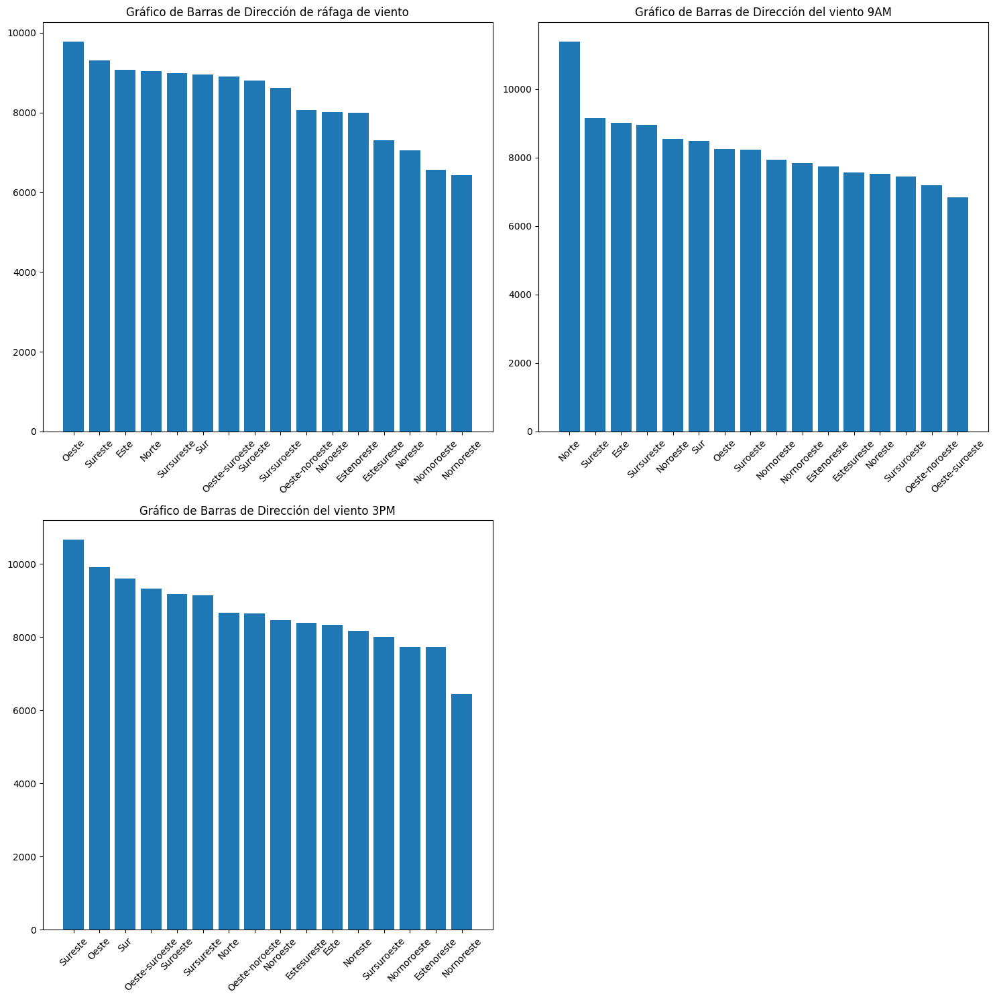

In [ ]:
import matplotlib.pyplot as plt

# Diccionario de traducción para las direcciones del viento
translation_dict = {
    'W': 'Oeste', 'WNW': 'Oeste-noroeste', 'WSW': 'Oeste-suroeste',
    'NE': 'Noreste', 'NNW': 'Nornoroeste', 'N': 'Norte', 'NNE': 'Nornoreste',
    'SW': 'Suroeste', 'ENE': 'Estenoreste', 'SSE': 'Sursureste', 'S': 'Sur',
    'NW': 'Noroeste', 'SE': 'Sureste', 'ESE': 'Estesureste', 'E': 'Este',
    'SSW': 'Sursuroeste', 'nan': 'N/A'
}

variables = ['windgustdir', 'winddir9am', 'winddir3pm']
labels = ['Dirección de ráfaga de viento', 'Dirección del viento 9AM', 'Dirección del viento 3PM']
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 15))

for i, (var, label) in enumerate(zip(variables, labels)):
    row = i // 2
    col = i % 2

    data = df[var].value_counts()

    # Traducción de las etiquetas
    translated_labels = [translation_dict.get(key, key) for key in data.index]

    axes[row, col].bar(translated_labels, data.values)

    axes[row, col].set_title('Gráfico de Barras de ' + label)

    axes[row, col].tick_params(axis='x', rotation=45)

fig.delaxes(axes[1, 1])

plt.tight_layout()
plt.show()


Las variables que indican la dirección del viento, tienen una inclinación al sur, por lo tanto hay mas outliers hacia el norte.

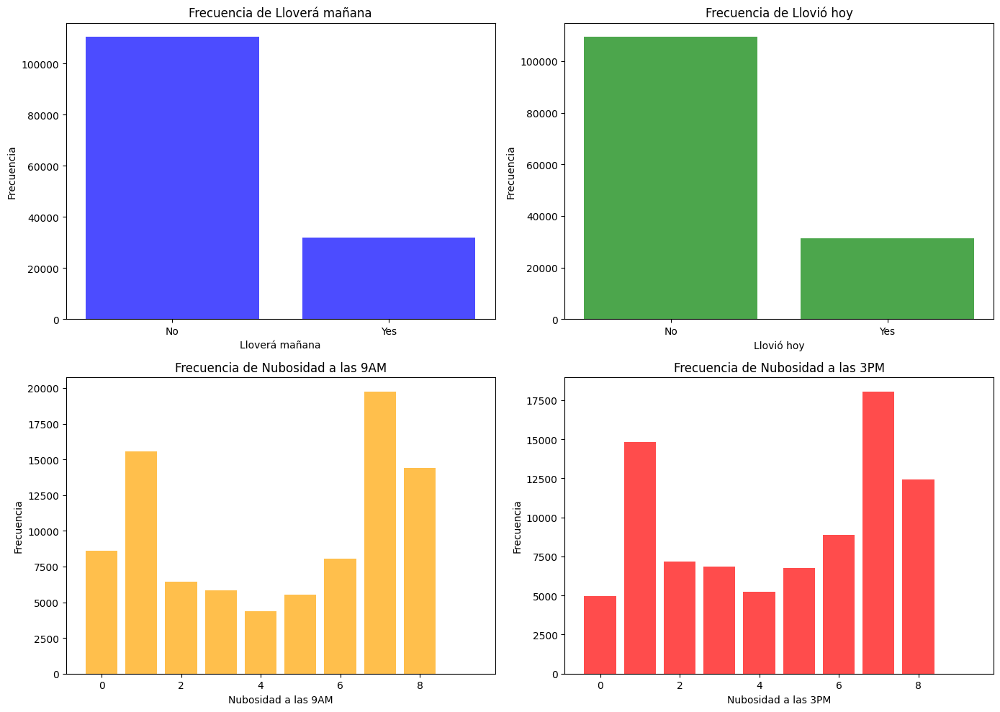

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Obtener frecuencias de las variables
raintomorrow_freq = df['raintomorrow'].value_counts().reset_index()
raintoday_freq = df['raintoday'].value_counts().reset_index()
cloud9am_freq = df['cloud9am'].value_counts().reset_index()
cloud3pm_freq = df['cloud3pm'].value_counts().reset_index()

# Renombrar columnas para claridad
raintomorrow_freq.columns = ['Lloverá mañana', 'Frecuencia']
raintoday_freq.columns = ['Llovió hoy', 'Frecuencia']
cloud9am_freq.columns = ['Nubosidad a las 9AM', 'Frecuencia']
cloud3pm_freq.columns = ['Nubosidad a las 3PM', 'Frecuencia']


# Crear figura y ejes
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))

# Gráfico de barras para Lloverá mañana
axes[0, 0].bar(raintomorrow_freq['Lloverá mañana'], raintomorrow_freq['Frecuencia'], color='blue', alpha=0.7)
axes[0, 0].set_title('Frecuencia de Lloverá mañana')
axes[0, 0].set_xlabel('Lloverá mañana')
axes[0, 0].set_ylabel('Frecuencia')

# Gráfico de barras para Llovió hoy
axes[0, 1].bar(raintoday_freq['Llovió hoy'], raintoday_freq['Frecuencia'], color='green', alpha=0.7)
axes[0, 1].set_title('Frecuencia de Llovió hoy')
axes[0, 1].set_xlabel('Llovió hoy')
axes[0, 1].set_ylabel('Frecuencia')

# Gráfico de barras para Nubosidad a las 9AM
axes[1, 0].bar(cloud9am_freq['Nubosidad a las 9AM'], cloud9am_freq['Frecuencia'], color='orange', alpha=0.7)
axes[1, 0].set_title('Frecuencia de Nubosidad a las 9AM')
axes[1, 0].set_xlabel('Nubosidad a las 9AM')
axes[1, 0].set_ylabel('Frecuencia')

# Gráfico de barras para Nubosidad a las 3PM
axes[1, 1].bar(cloud3pm_freq['Nubosidad a las 3PM'], cloud3pm_freq['Frecuencia'], color='red', alpha=0.7)
axes[1, 1].set_title('Frecuencia de Nubosidad a las 3PM')
axes[1, 1].set_xlabel('Nubosidad a las 3PM')
axes[1, 1].set_ylabel('Frecuencia')

# Ajustar diseño y mostrar gráfico
plt.tight_layout()
plt.show()


En las variables "si llovera mañana", y se "si llovio hoy", se encuentra el mismo sesgo debido a las ocurrencias de la lluvia. La variable nubosidad de 9am y 3pm tiene sus registros mas altos en ambos extremos.

###Variabilidad

Se utiliza para ver como se relacionan los números individuales dentro de un conjunto de datos.

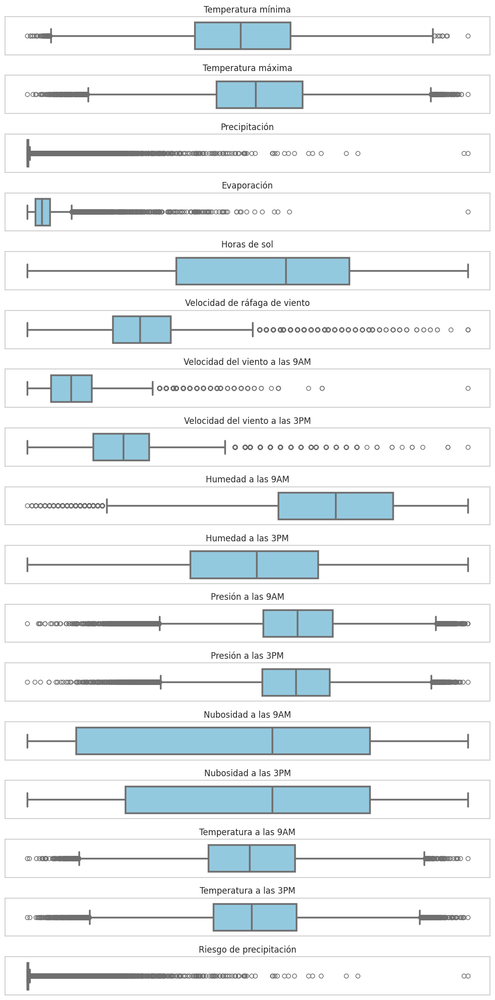

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style="whitegrid")
plt.figure(figsize=(10, 20))

# Traducción de las variables al español
columnas_numericas = [
    'Temperatura mínima', 'Temperatura máxima', 'Precipitación', 'Evaporación', 'Horas de sol', 'Velocidad de ráfaga de viento',
    'Velocidad del viento a las 9AM', 'Velocidad del viento a las 3PM', 'Humedad a las 9AM', 'Humedad a las 3PM', 'Presión a las 9AM',
    'Presión a las 3PM', 'Nubosidad a las 9AM', 'Nubosidad a las 3PM', 'Temperatura a las 9AM', 'Temperatura a las 3PM', 'Riesgo de precipitación'
]

# Asumiendo que el DataFrame df tiene los nombres de columnas en inglés, y traduciendo para los títulos
variables_ingles = ['mintemp', 'maxtemp', 'rainfall', 'evaporation', 'sunshine', 'windgustspeed',
                    'windspeed9am', 'windspeed3pm', 'humidity9am', 'humidity3pm', 'pressure9am',
                    'pressure3pm', 'cloud9am', 'cloud3pm', 'temp9am', 'temp3pm', 'risk_mm']

for i, (col, titulo) in enumerate(zip(variables_ingles, columnas_numericas)):
    plt.subplot(len(variables_ingles), 1, i + 1)
    sns.boxplot(x=df[col], color='skyblue', showfliers=True, orient='h', linewidth=2.5, width=0.7)
    plt.title(titulo)
    plt.xlabel('')  # Eliminar la etiqueta del eje x
    plt.xticks([])  # Eliminar los ticks del eje x
    plt.tight_layout()

plt.show()


Se puede apreciar lo especulado en la sección anterior. Cabe destacar el vasto número de valores atípicos precipitación, evaporación y riesgo de precipitación.

## Detección de outliers

Los outliers o valores atípicos son datos anormales dentro de un conjunto de datos.

En terminos simples, los outliers son valores extremadamente bajos o altos en comparación con el punto de datos más cercano

Es de vital importancia detectar los valores atípicos de una columna de datos, ya que estos influyen en el modelo de predicción que se utilizará para predecir datos futuros.

###Puntuación IQR

Se ha utilizado el método IQR, IQR usa el rango intercuartílico para detectar valores atípicos. La puntuación IQR trabaja con la variación del conjunto de datos.


Se ha decidido iniciar la detección por este tipo de proceso por sobre el método de identificación, "Puntuación Z", ya que este no precisa de una distribución Gaussiana de la data. Y se requiere tener una mirada por sobre los datos no normalizados, es particularmente útil en conjunto de datos sesgados.

In [ ]:
import pandas as pd

variables = ['mintemp', 'maxtemp', 'rainfall', 'evaporation', 'sunshine', 'windgustspeed',
                     'windspeed9am', 'windspeed3pm', 'humidity9am', 'humidity3pm', 'pressure9am',
                     'pressure3pm', 'cloud9am', 'cloud3pm', 'temp9am', 'temp3pm', 'risk_mm']
iqr_scores = {}
for var in variables:
    q1 = df[var].quantile(0.25)
    q3 = df[var].quantile(0.75)
    iqr = q3 - q1
    iqr_scores[var] = iqr

print("Puntuación IQR para cada variable:")
for var, score in iqr_scores.items():
    print(f"{var}: {score}")

outliers = {}
for var in variables:
    q1 = df[var].quantile(0.25)
    q3 = df[var].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers[var] = df[(df[var] < lower_bound) | (df[var] > upper_bound)]

print("\nOutliers detectados:")
for var, df_outliers in outliers.items():
    if not df_outliers.empty:
        print(f"{var}: {len(df_outliers)} outliers")


Puntuación IQR para cada variable:
mintemp: 9.200000000000001
maxtemp: 10.3
rainfall: 0.8
evaporation: 4.800000000000001
sunshine: 5.699999999999999
windgustspeed: 17.0
windspeed9am: 12.0
windspeed3pm: 11.0
humidity9am: 26.0
humidity3pm: 29.0
pressure9am: 9.5
pressure3pm: 9.600000000000023
cloud9am: 6.0
cloud3pm: 5.0
temp9am: 9.3
temp3pm: 9.799999999999997
risk_mm: 0.8

Outliers detectados:
mintemp: 62 outliers
maxtemp: 459 outliers
rainfall: 25228 outliers
evaporation: 1954 outliers
windgustspeed: 3006 outliers
windspeed9am: 1739 outliers
windspeed3pm: 2458 outliers
humidity9am: 1419 outliers
pressure9am: 1174 outliers
pressure3pm: 906 outliers
temp9am: 247 outliers
temp3pm: 735 outliers
risk_mm: 25573 outliers


Puntuación IQR para cada variable:

temperatura mínima: 9.200000000000001

temperatura máxima: 10.3

precipitación: 0.8

evaporación: 4.800000000000001

luz solar: 5.699999999999999

velocidad de ráfaga de viento: 17.0

velocidad del viento a las 9AM: 12.0

velocidad del viento a las 3PM: 11.0

humedad a las 9AM: 26.0

humedad a las 3PM: 28.0

presión a las 9AM: 8.299999999999955

presión a las 3PM: 8.399999999999977

nubosidad a las 9AM: 6.0

nubosidad a las 3PM: 5.0

temperatura a las 9AM: 9.2

temperatura a las 3PM: 9.600000000000001

riesgo de precipitaciones: 0.8


Outliers detectados:

temperatura mínima: 62 outliers

temperatura máxima: 459 outliers

precipitación: 25228 outliers

evaporación: 1954 outliers

velocidad de ráfaga de viento: 3006 outliers

velocidad del viento a las 9AM: 1739 outliers

velocidad del viento a las 3PM: 2458 outliers

humedad a las 9AM: 1419 outliers

presión a las 9AM: 2708 outliers

presión a las 3PM: 2305 outliers

temperatura a las 9AM: 292 outliers

temperatura a las 3PM: 840 outliers

riesgo de precipitaciones: 25573 outliers


La tesis general y el sentido común indica que a menor es la variabilidad intercuartílica, menor será la cantidad de valores atípicos. Sin embargo, se esta trabajando con algunas variables que poseen extremos de variabilidad muy marcados.

Se aprecia que aquellos valores con una distribución más normal poseen baja cantidad de outliers y puntuacion IQR más baja.

La naturaleza de la climatología nos entrega eventos particulares que elevan los niveles de frecuencia de una clase, asi como tambien su distribución. En esta situación en particular se tiene 'risk_mm' (riesgo de milimetros de agua que pueden caer) y 'rainfall' (lluvia caída)

Por ejemplo: Temporales, tornados, huracanes, chubascos ocasionales e incluso cadenas largas de días sin precipitaciones.


###Z-Score


La puntuación Z asume que las variables tienen una distribución en forma de campana de Gaud, en esta se representa el valor de z, por la cantidad de desviaciones estandar alejados de la media,
Normalmente se definen valores atípicos como
puntos cuyo módulo de puntuación z es mayor que un
valor de umbral.

La decisión de usar otro procedimiento pasa por tener un acercamiento más preciso de la cantidad de valores no comunes de aquellas variables con una distribución de la data en forma de campana de Gaud.

La decisión de no usar este procedimiento en las demás variables esta justificada porque en distribuciones sesgadas o no normales, los valores extremos tienden a distorsionar la media y la desviación estandar, afectando la efectividad del proceso.

Las variables a disposición del método son las siguientes: 'pressure9am'(presión a las 9AM) , 'pressure3pm'(presión a las 3PM), 'temp9am' (temperatura a las 9AM), 'temp3pm' (temperatura a las 3PM), 'maxtemp'(temperatura máxima en el día), 'mintemp' (temperatura mínima en el día), 'humidity3pm' (humedad a las 3PM) y 'humidity9am' (humedad a las 9AM)

In [ ]:
import pandas as pd
from scipy.stats import zscore

variables = ['pressure9am', 'pressure3pm', 'temp9am', 'temp3pm', 'maxtemp', 'mintemp', 'humidity3pm', 'humidity9am']

df[variables] = df[variables].apply(pd.to_numeric, errors='coerce')

df[variables] = df[variables].fillna(df[variables].median())

df_zscore = df[variables].apply(zscore)


In [ ]:
import pandas as pd
from scipy.stats import zscore

# Definir las variables
variables = ['pressure9am', 'pressure3pm', 'temp9am', 'temp3pm', 'maxtemp', 'mintemp', 'humidity3pm', 'humidity9am']

# Convertir las variables a numéricas, si es necesario
df[variables] = df[variables].apply(pd.to_numeric, errors='coerce')

# Rellenar valores nulos con la mediana de cada variable
df[variables] = df[variables].fillna(df[variables].median())

# Calcular el puntaje z (z-score) para detectar outliers
df_zscore = df[variables].apply(zscore)

# Umbral para considerar un valor como outlier
umbral = 3

# Identificar outliers
outliers = (df_zscore > umbral) | (df_zscore < -umbral)

# Contar la cantidad de outliers por variable
cantidad_outliers = outliers.sum()

print("\nNúmero de outliers por variable:")
for variable, cantidad in cantidad_outliers.items():
    print(f"{variable}: {cantidad}")



Número de outliers por variable:
pressure9am: 763
pressure3pm: 658
temp9am: 138
temp3pm: 430
maxtemp: 309
mintemp: 25
humidity3pm: 0
humidity9am: 583


presión a las 9AM: 763

presión a las 3PM: 658

temperatura a las 9AM: 138

temperatura a las 3PM: 430

temperatura máxima: 309

temperatura mínima: 25

humedad a las 3PM: 0

humedad a las 9AM: 583


La diferencia en la identificación de datos atípicos entre z-score e IQR, podría deberse a la naturaleza robusta frente a valores extremos del método IQR que identifica más outliers.

En conclusión los datos obtenidos recientemente podrían considerarse mas fidedignos, la razon recae completamente en la sensibilidad del modelo a la distancia de la media en términos de desviaciones estándar.

## Detección de nulos

Los datos nulos, significan inexistencia de los datos, debudo a errores de medicion, falta de disponilidad, eliminaciones intencionales, entre otras.

Detectar estos valores es de suma importancia para no restarle valor y confiabilidad a los modelos predictivos.

In [ ]:
df.isnull().sum()

date                 0
location             0
mintemp              0
maxtemp              0
rainfall          1406
evaporation      60843
sunshine         67816
windgustdir       9330
windgustspeed     9270
winddir9am       10013
winddir3pm        3778
windspeed9am      1348
windspeed3pm      2630
humidity9am          0
humidity3pm          0
pressure9am          0
pressure3pm          0
cloud9am         53657
cloud3pm         57094
temp9am              0
temp3pm              0
raintoday         1406
risk_mm              0
raintomorrow         0
dtype: int64

Se aprecian 20 variables con valores nulos.

Se ha establecido un parámetro donde:

-Menos del 5% de perdida de información no representa un problema significativo

-Entre 5% - 15% de perdida de información representa una preocupación a baja escala

-Mas del 15% de datos nulos representa un problema serio que sera abordado con especial cautela.

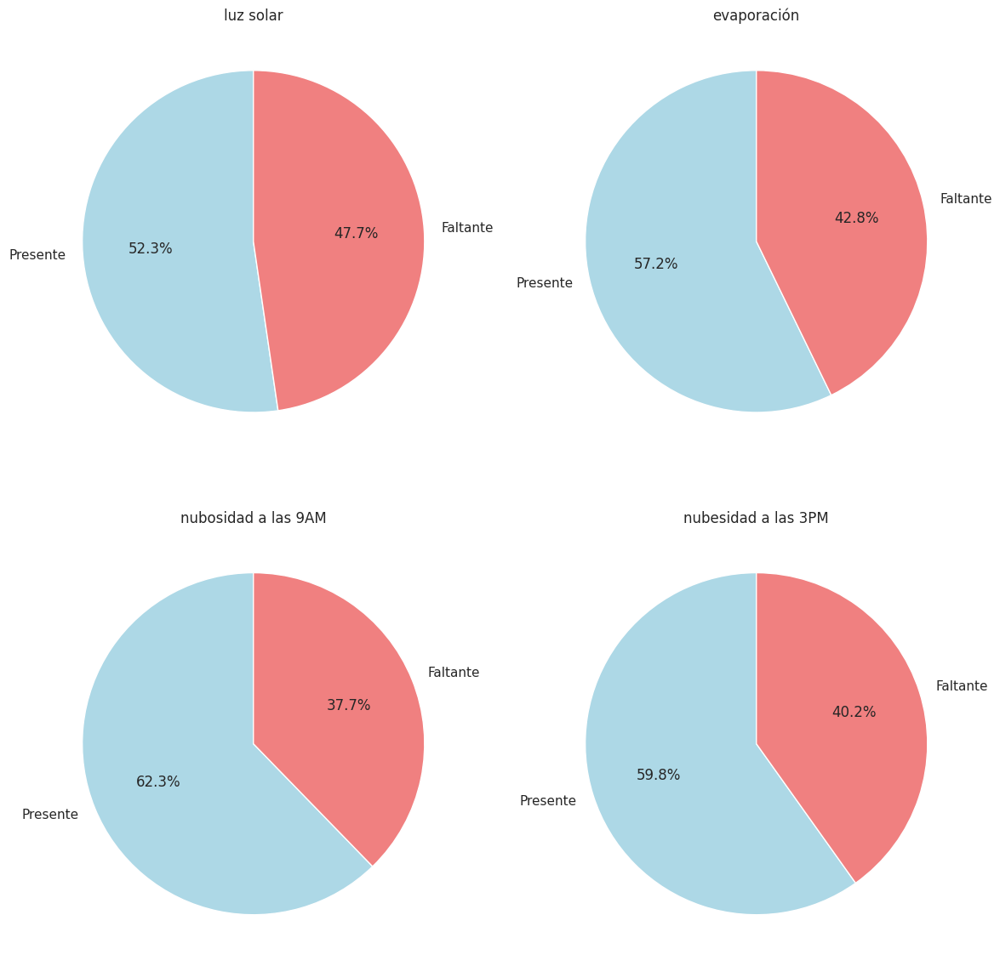

In [ ]:
import matplotlib.pyplot as plt

variables = ['luz solar', 'evaporación', 'nubosidad a las 9AM', 'nubesidad a las 3PM']
missing_counts = [67816, 60843, 53657, 57094]

total_data = 142193

present_counts = [total_data - count for count in missing_counts]

def create_missing_data_pie_chart(variables, present_counts, missing_counts):
    fig, axes = plt.subplots(2, 2, figsize=(12, 12))
    axes = axes.flatten()

    for i, (variable, present, missing) in enumerate(zip(variables, present_counts, missing_counts)):
        ax = axes[i]
        ax.pie([present, missing], labels=['Presente', 'Faltante'], autopct='%1.1f%%', startangle=90, colors=['lightblue', 'lightcoral'])
        ax.set_title(variable)

    plt.tight_layout()
    plt.show()

create_missing_data_pie_chart(variables, present_counts, missing_counts)


Estas 4 variables, presentan cerca del 40% de falta de datos, los cuales se imputaran(cambiar valores inexistentes por unos representativos de la distribución)

##Matriz de correlación

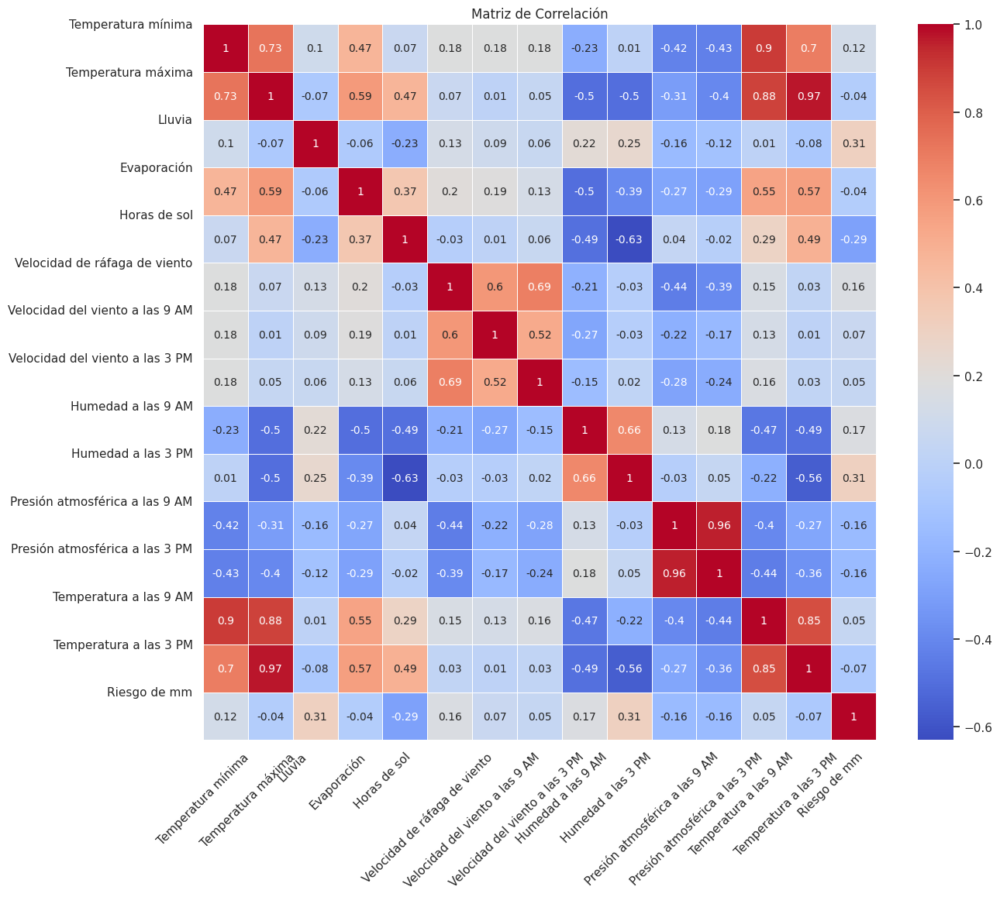

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

variables = ['mintemp', 'maxtemp', 'rainfall', 'evaporation', 'sunshine', 'windgustspeed',
             'windspeed9am', 'windspeed3pm', 'humidity9am', 'humidity3pm', 'pressure9am',
             'pressure3pm', 'temp9am', 'temp3pm', 'risk_mm']

# Calculando la matriz de correlación
correlation_matrix = df[variables].corr().round(2)

# Configurando el tamaño de la figura
plt.figure(figsize=(14, 12))

# Creando el mapa de calor con anotaciones
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, annot_kws={"size": 10})

# Traduciendo etiquetas de los ejes x e y
plt.xticks(ticks=range(len(variables)), labels=['Temperatura mínima', 'Temperatura máxima', 'Lluvia', 'Evaporación', 'Horas de sol',
             'Velocidad de ráfaga de viento', 'Velocidad del viento a las 9 AM', 'Velocidad del viento a las 3 PM',
             'Humedad a las 9 AM', 'Humedad a las 3 PM', 'Presión atmosférica a las 9 AM',
             'Presión atmosférica a las 3 PM', 'Temperatura a las 9 AM', 'Temperatura a las 3 PM', 'Riesgo de mm'], rotation=45)
plt.yticks(ticks=range(len(variables)), labels=['Temperatura mínima', 'Temperatura máxima', 'Lluvia', 'Evaporación', 'Horas de sol',
             'Velocidad de ráfaga de viento', 'Velocidad del viento a las 9 AM', 'Velocidad del viento a las 3 PM',
             'Humedad a las 9 AM', 'Humedad a las 3 PM', 'Presión atmosférica a las 9 AM',
             'Presión atmosférica a las 3 PM', 'Temperatura a las 9 AM', 'Temperatura a las 3 PM', 'Riesgo de mm'])

# Configurando el título y mostrando el gráfico
plt.title('Matriz de Correlación')
plt.show()


Las variables que nos interesan hasta el momento para cumplir con nuestros KPI's son:

1. La variables en relación la humedad:, estas nos sirven para identificar niebla en el entorno, saber si afectaran al globo las condiciones de humedad.
2. Las variables relacionadas a la velocidad del viento, estas nos ayduaran a predecir si habran bajas velocidades, que nos impidira llegar a tiempos en recorrido


##Insights

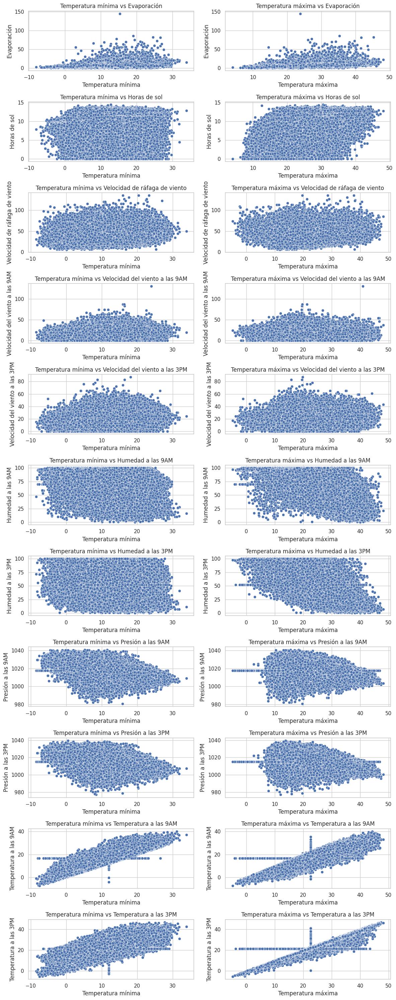

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

variables = ['evaporation', 'sunshine', 'windgustspeed',
             'windspeed9am', 'windspeed3pm', 'humidity9am', 'humidity3pm',
             'pressure9am', 'pressure3pm', 'temp9am', 'temp3pm']

variables_espanol = [
    'Evaporación', 'Horas de sol', 'Velocidad de ráfaga de viento',
    'Velocidad del viento a las 9AM', 'Velocidad del viento a las 3PM', 'Humedad a las 9AM', 'Humedad a las 3PM',
    'Presión a las 9AM', 'Presión a las 3PM', 'Temperatura a las 9AM', 'Temperatura a las 3PM'
]

sns.set(style="whitegrid")
fig, axs = plt.subplots(nrows=len(variables), ncols=2, figsize=(12, 30))

for i, var in enumerate(variables):
    sns.scatterplot(x='mintemp', y=var, data=df, ax=axs[i, 0])
    axs[i, 0].set_title(f'Temperatura mínima vs {variables_espanol[i]}')
    axs[i, 0].set_xlabel('Temperatura mínima')
    axs[i, 0].set_ylabel(variables_espanol[i])

    sns.scatterplot(x='maxtemp', y=var, data=df, ax=axs[i, 1])
    axs[i, 1].set_title(f'Temperatura máxima vs {variables_espanol[i]}')
    axs[i, 1].set_xlabel('Temperatura máxima')
    axs[i, 1].set_ylabel(variables_espanol[i])

plt.tight_layout()
plt.show()


-Se aprecia relación lineal entre las temperaturas.

-Con humedad se aprecia una relación lineal negativa con la humedad

-Se aprecia una leve relacion lineal con la evaporación





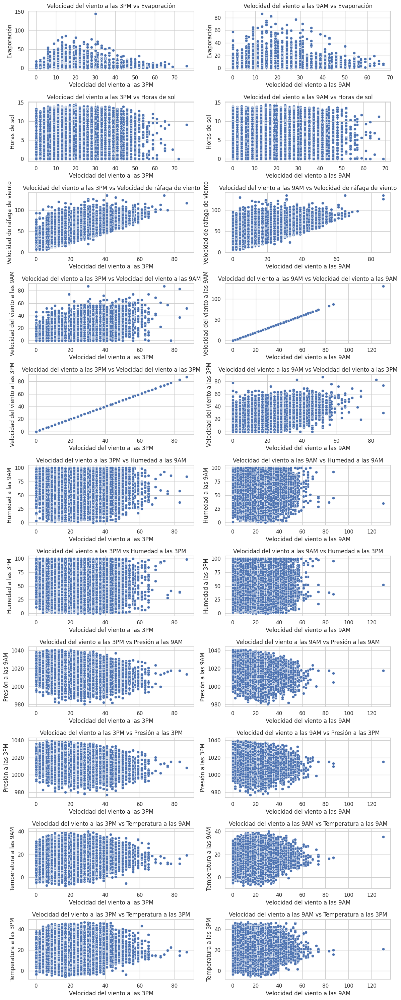

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

variables = ['evaporation', 'sunshine', 'windgustspeed',
             'windspeed9am', 'windspeed3pm', 'humidity9am', 'humidity3pm',
             'pressure9am', 'pressure3pm', 'temp9am', 'temp3pm']

variables_espanol = [
    'Evaporación', 'Horas de sol', 'Velocidad de ráfaga de viento',
    'Velocidad del viento a las 9AM', 'Velocidad del viento a las 3PM', 'Humedad a las 9AM', 'Humedad a las 3PM',
    'Presión a las 9AM', 'Presión a las 3PM', 'Temperatura a las 9AM', 'Temperatura a las 3PM'
]

sns.set(style="whitegrid")
fig, axs = plt.subplots(nrows=len(variables), ncols=2, figsize=(12, 30))

for i, var in enumerate(variables):
    sns.scatterplot(x='windspeed3pm', y=var, data=df, ax=axs[i, 0])
    axs[i, 0].set_title(f'Velocidad del viento a las 3PM vs {variables_espanol[i]}')
    axs[i, 0].set_xlabel('Velocidad del viento a las 3PM')
    axs[i, 0].set_ylabel(variables_espanol[i])

    sns.scatterplot(x='windspeed9am', y=var, data=df, ax=axs[i, 1])
    axs[i, 1].set_title(f'Velocidad del viento a las 9AM vs {variables_espanol[i]}')
    axs[i, 1].set_xlabel('Velocidad del viento a las 9AM')
    axs[i, 1].set_ylabel(variables_espanol[i])

plt.tight_layout()
plt.show()


-Solo se aprecian relaciones relevantes con variables de velocidad del viento

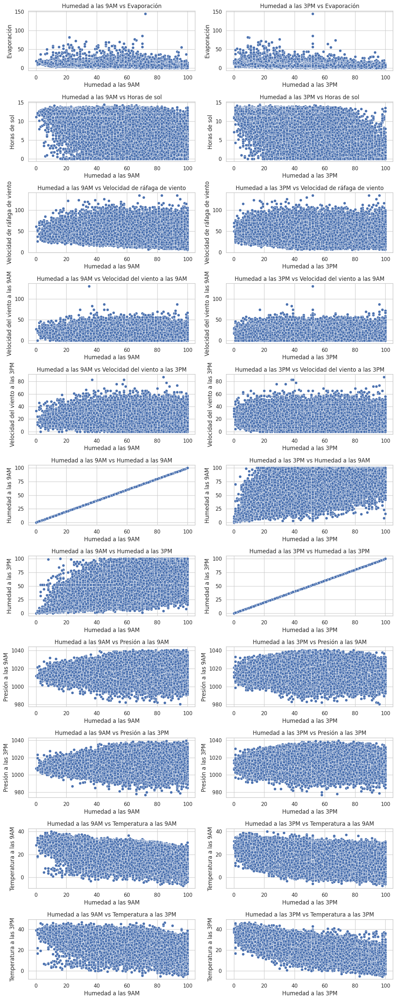

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

variables = ['evaporation', 'sunshine', 'windgustspeed',
             'windspeed9am', 'windspeed3pm', 'humidity9am', 'humidity3pm',
             'pressure9am', 'pressure3pm', 'temp9am', 'temp3pm']

variables_espanol = [
    'Evaporación', 'Horas de sol', 'Velocidad de ráfaga de viento',
    'Velocidad del viento a las 9AM', 'Velocidad del viento a las 3PM', 'Humedad a las 9AM', 'Humedad a las 3PM',
    'Presión a las 9AM', 'Presión a las 3PM', 'Temperatura a las 9AM', 'Temperatura a las 3PM'
]

sns.set(style="whitegrid")
fig, axs = plt.subplots(nrows=len(variables), ncols=2, figsize=(12, 30))

for i, var in enumerate(variables):
    sns.scatterplot(x='humidity9am', y=var, data=df, ax=axs[i, 0])
    axs[i, 0].set_title(f'Humedad a las 9AM vs {variables_espanol[i]}')
    axs[i, 0].set_xlabel('Humedad a las 9AM')
    axs[i, 0].set_ylabel(variables_espanol[i])

    sns.scatterplot(x='humidity3pm', y=var, data=df, ax=axs[i, 1])
    axs[i, 1].set_title(f'Humedad a las 3PM vs {variables_espanol[i]}')
    axs[i, 1].set_xlabel('Humedad a las 3PM')
    axs[i, 1].set_ylabel(variables_espanol[i])

plt.tight_layout()
plt.show()


-Se aprecia linealidad con variables relacionadas a la temperatura y humedad

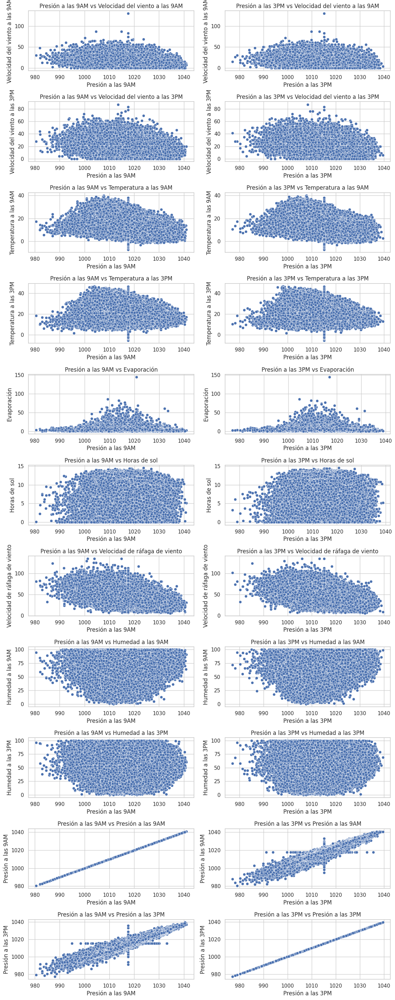

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

variables = ['windspeed9am', 'windspeed3pm', 'temp9am', 'temp3pm',
             'evaporation', 'sunshine', 'windgustspeed', 'humidity9am', 'humidity3pm', 'pressure9am', 'pressure3pm']

variables_espanol = [
    'Velocidad del viento a las 9AM', 'Velocidad del viento a las 3PM', 'Temperatura a las 9AM', 'Temperatura a las 3PM',
    'Evaporación', 'Horas de sol', 'Velocidad de ráfaga de viento', 'Humedad a las 9AM', 'Humedad a las 3PM',
    'Presión a las 9AM', 'Presión a las 3PM'
]

fig, axs = plt.subplots(nrows=len(variables), ncols=2, figsize=(12, 30))

for i, var in enumerate(variables):
    sns.scatterplot(x='pressure9am', y=var, data=df, ax=axs[i, 0])
    axs[i, 0].set_title(f'Presión a las 9AM vs {variables_espanol[i]}')
    axs[i, 0].set_xlabel('Presión a las 9AM')
    axs[i, 0].set_ylabel(variables_espanol[i])

    sns.scatterplot(x='pressure3pm', y=var, data=df, ax=axs[i, 1])
    axs[i, 1].set_title(f'Presión a las 3PM vs {variables_espanol[i]}')
    axs[i, 1].set_xlabel('Presión a las 3PM')
    axs[i, 1].set_ylabel(variables_espanol[i])

plt.tight_layout()
plt.show()


- Se relacionan linealmente de con variables de presión

- Se relacionan de forma lineal negativa con las varibales de velocidad del viento.



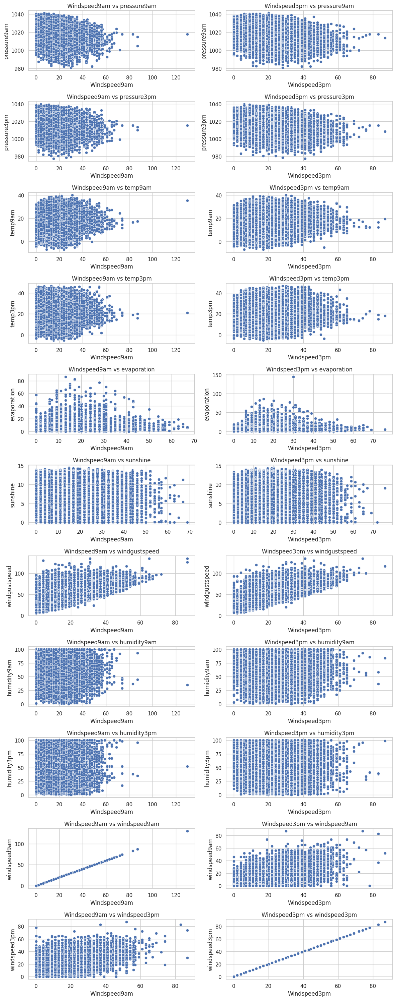

In [ ]:

variables = ['pressure9am', 'pressure3pm', 'temp9am', 'temp3pm',
             'evaporation', 'sunshine', 'windgustspeed', 'humidity9am', 'humidity3pm', 'windspeed9am', 'windspeed3pm']

fig, axs = plt.subplots(nrows=len(variables), ncols=2, figsize=(12, 30))

for i, var in enumerate(variables):
    sns.scatterplot(x='windspeed9am', y=var, data=df, ax=axs[i, 0])
    axs[i, 0].set_title(f'Windspeed9am vs {var}')
    axs[i, 0].set_xlabel('Windspeed9am')
    axs[i, 0].set_ylabel(var)

    sns.scatterplot(x='windspeed3pm', y=var, data=df, ax=axs[i, 1])
    axs[i, 1].set_title(f'Windspeed3pm vs {var}')
    axs[i, 1].set_xlabel('Windspeed3pm')
    axs[i, 1].set_ylabel(var)

plt.tight_layout()
plt.show()


-Se relacionan linealmente con variables de velocidad del viento.

-Se observan muchos espacios entre los puntos, esto debido a que la velocidad del viento es una variable continua


#Fase 3: Comprensión de los datos

En esta fase se lleva a cabo la recolección y exploración inicial de los datos, con el objetivo de establecer
un primer contacto con el problema

###  Tratamiento de nulls

Usar media y mediana para trabajar valores sin atípicos

La variable humedad a las 3pm, pero la variable radiación solar tiene un sesgo hacia la derecha, por ende, se ha utilizado la mediana para imputar.

In [ ]:
columnas_a_imputar = ['humidity3pm', 'sunshine']

mediana_sunshine = df['sunshine'].median()
df['sunshine'].fillna(mediana_sunshine, inplace=True)

mediana_humidity3pm = df['humidity3pm'].median()
df['humidity3pm'].fillna(mediana_humidity3pm, inplace=True)




Las variables cuantitativas sin atípicos, ya han sido imputadas y no tienen valores nulos



Usar media con variables con distribución normal y pocos valors atípicos, que son presión a las 9am, presión a las 3pm, temperatura a las 9am, temperatura a las 3pm, temperatura máxima, temperatura mínima y humedad a las 9am

In [ ]:
columns_to_impute = ['pressure9am', 'pressure3pm', 'temp9am', 'temp3pm',
                     'maxtemp', 'mintemp', 'humidity9am']

for col in columns_to_impute:
    mean_value = df[col].mean()
    df[col] = df[col].fillna(mean_value)

Usar mediana con variables cuantitativas sin una distribución normal con  valores atípicos, con el fin de mantener la distribución de los datos con las variables, velocidad de las ráfagas de viento, velocidad del viento a las 9am, velocidad del viento a las 3pm, precipitaciones y evaporación

In [ ]:
import pandas as pd
from sklearn.impute import SimpleImputer

columns_to_impute = ["windgustspeed", "windspeed9am", "windspeed3pm", "rainfall", "evaporation"]

imputer = SimpleImputer(strategy="median")
df[columns_to_impute] = imputer.fit_transform(df[columns_to_impute])




imputación de variables cualitativas usando knn, hay muchos outliers y una imputación por la moda sesgaría aún mas los datos, cambiando su distribución.

#Imputar con sistema de frecuencias

Se imputa por sistema de frecuencias a las variables categóricas para no perder la distribución de los datos, las variables de nubosidad a las 9am y las variables de nubosidad a las 3pm

In [ ]:

cloud9am_frequencies = df['cloud9am'].value_counts(normalize=True)

cloud3pm_frequencies = df['cloud3pm'].value_counts(normalize=True)

def impute_categorical_nulls(series, frequencies):
    null_indices = series.isnull()
    series[null_indices] = np.random.choice(frequencies.index, size=null_indices.sum(), p=frequencies.values)

impute_categorical_nulls(df['cloud9am'], cloud9am_frequencies)
impute_categorical_nulls(df['cloud3pm'], cloud3pm_frequencies)



<ipython-input-53-a93646e64b7f>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  series[null_indices] = np.random.choice(frequencies.index, size=null_indices.sum(), p=frequencies.values)
<ipython-input-53-a93646e64b7f>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  series[null_indices] = np.random.choice(frequencies.index, size=null_indices.sum(), p=frequencies.values)


variables categóricas con pocos valores nulos, se imputan por la moda,

In [ ]:
import pandas as pd


variables_imputar = ['windgustdir', 'winddir9am', 'winddir3pm', 'raintoday']

for var in variables_imputar:
    moda = df[var].mode()[0]
    df[var].fillna(moda, inplace=True)

print(df.isnull().sum())


date             0
location         0
mintemp          0
maxtemp          0
rainfall         0
evaporation      0
sunshine         0
windgustdir      0
windgustspeed    0
winddir9am       0
winddir3pm       0
windspeed9am     0
windspeed3pm     0
humidity9am      0
humidity3pm      0
pressure9am      0
pressure3pm      0
cloud9am         0
cloud3pm         0
temp9am          0
temp3pm          0
raintoday        0
risk_mm          0
raintomorrow     0
dtype: int64


temperatura mínima = 0

temperatura máxima = 0

precipitación = 0

evaporación = 0

horas de sol = 0

dirección de ráfaga de viento = 0

velocidad de ráfaga de viento = 0

dirección del viento a las 9am = 0

dirección del viento a las 3pm = 0

velocidad del viento a las 9am = 0

velocidad del viento a las 3pm = 0

humedad a las 9am = 0

humedad a las 3pm = 0

presión a las 9am = 0

presión a las 3pm = 0

nubosidad a las 9am = 0

nubosidad a las 3pm = 0

temperatura a las 9am  = 0

temperatura a las 3pm  =0

llueve hoy = 0

riesgo de precipitaciones = 0

llueve mañana = 0



Ya no se tiene valores nulos, la data puede seguir su proceso de transformación con normalidad.

##Transformación de las variables categóricas a númericas.

Se transforman variables categóricas a numéricas para que sus caracterísiticas sean propicias para los modelos predictivos

En este caso se uso label encoder

In [ ]:
import pandas as pd


columns_to_convert = [ 'windgustdir', 'winddir9am', 'winddir3pm', 'cloud9am', 'cloud3pm']

for col in columns_to_convert:
    df[col] = df[col].astype('category').cat.codes


###OneHotEncoder

Aquí se transformarán las variables binarias, donde 0 es la clase negativa, y 1, que es la clase positiva. Que indican afirmacion y negación respectivamente.

In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder


le = LabelEncoder()

df['raintoday'] = le.fit_transform(df['raintoday'])
df['raintomorrow'] = le.fit_transform(df['raintomorrow'])

print(df.head())


         date location  mintemp  maxtemp  rainfall  evaporation  sunshine  \
0  2008-12-01   Albury     13.4     22.9       0.6          4.8       8.5   
1  2008-12-02   Albury      7.4     25.1       0.0          4.8       8.5   
2  2008-12-03   Albury     12.9     25.7       0.0          4.8       8.5   
3  2008-12-04   Albury      9.2     28.0       0.0          4.8       8.5   
4  2008-12-05   Albury     17.5     32.3       1.0          4.8       8.5   

   windgustdir  windgustspeed  winddir9am  ...  humidity3pm  pressure9am  \
0           13           44.0          13  ...         22.0       1007.7   
1           14           44.0           6  ...         25.0       1010.6   
2           15           46.0          13  ...         30.0       1007.6   
3            4           24.0           9  ...         16.0       1017.6   
4           13           41.0           1  ...         33.0       1010.8   

   pressure3pm  cloud9am  cloud3pm  temp9am  temp3pm  raintoday  risk_mm  \
0   

####esta es la nomenclatura de la dirección del viento para dirección del viento a las 3pm, dirección del viento a las 9am y velocidad de rafaga del viento.

0: N (Norte)

1: NNE (Nornordeste)

2: NE (Noreste)

3: ENE (Estenoreste)

4: E (Este)

5: ESE (Estesureste)

6: SE (Sureste)

7: SSE (Suresureste)

8: S (Sur)

9: SSW (Sursuroeste)

10: SW (Suroeste)

11: WSW (Oestesuroeste)

12: W (Oeste)

13: WNW (Oestenoroeste)

14: NW (Noroeste)

15: NNW (Nornoroeste)

##Insights

###Matriz de correlación

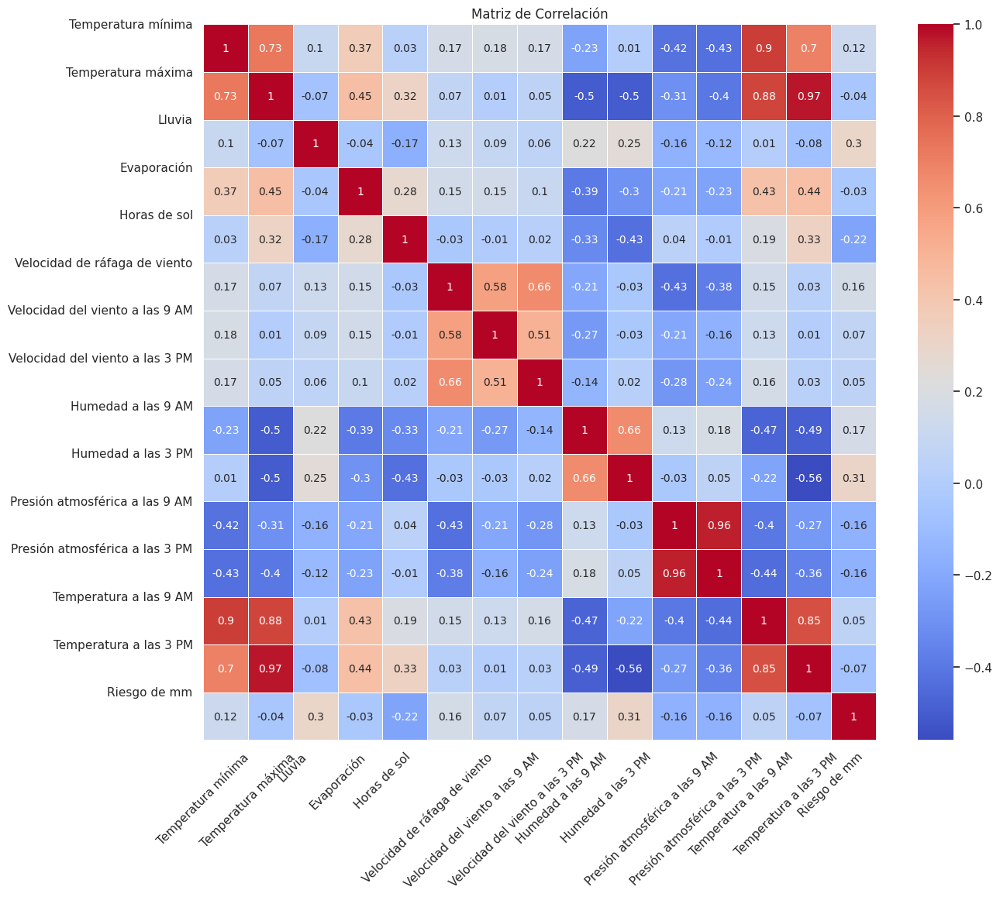

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

variables = ['mintemp', 'maxtemp', 'rainfall', 'evaporation', 'sunshine', 'windgustspeed',
             'windspeed9am', 'windspeed3pm', 'humidity9am', 'humidity3pm', 'pressure9am',
             'pressure3pm', 'temp9am', 'temp3pm', 'risk_mm']

# Calculando la matriz de correlación
matriz_correlacion = df[variables].corr().round(2)

# Configurando el tamaño de la figura
plt.figure(figsize=(14, 12))

# Creando el mapa de calor con anotaciones
sns.heatmap(matriz_correlacion, annot=True, cmap='coolwarm', linewidths=0.5, annot_kws={"size": 10})

# Traduciendo etiquetas de los ejes x e y
plt.xticks(ticks=range(len(variables)), labels=['Temperatura mínima', 'Temperatura máxima', 'Lluvia', 'Evaporación', 'Horas de sol',
             'Velocidad de ráfaga de viento', 'Velocidad del viento a las 9 AM', 'Velocidad del viento a las 3 PM',
             'Humedad a las 9 AM', 'Humedad a las 3 PM', 'Presión atmosférica a las 9 AM',
             'Presión atmosférica a las 3 PM', 'Temperatura a las 9 AM', 'Temperatura a las 3 PM', 'Riesgo de mm'], rotation=45)
plt.yticks(ticks=range(len(variables)), labels=['Temperatura mínima', 'Temperatura máxima', 'Lluvia', 'Evaporación', 'Horas de sol',
             'Velocidad de ráfaga de viento', 'Velocidad del viento a las 9 AM', 'Velocidad del viento a las 3 PM',
             'Humedad a las 9 AM', 'Humedad a las 3 PM', 'Presión atmosférica a las 9 AM',
             'Presión atmosférica a las 3 PM', 'Temperatura a las 9 AM', 'Temperatura a las 3 PM', 'Riesgo de mm'])

# Configurando el título y mostrando el gráfico
plt.title('Matriz de Correlación')
plt.show()


In [ ]:
import pandas as pd

# Variables para incluir en el análisis
variables = ['mintemp', 'maxtemp', 'rainfall', 'evaporation', 'sunshine', 'windgustspeed',
             'windspeed9am', 'windspeed3pm', 'humidity9am', 'humidity3pm', 'pressure9am',
             'pressure3pm', 'cloud9am', 'cloud3pm', 'temp9am', 'temp3pm', 'risk_mm','raintoday','raintomorrow']

# Calcular la matriz de correlación
correlation_matrix = df[variables].corr()

# Obtener las correlaciones con respecto a 'humidity3pm'
correlation_with_humidity3pm = correlation_matrix['humidity3pm'].sort_values(ascending=False)

# Imprimir las 5 variables con mayor correlación con 'humidity3pm'
top_7_correlations = correlation_with_humidity3pm.drop('humidity3pm').head(10)
print(top_7_correlations)


humidity9am     0.660071
raintomorrow    0.439741
raintoday       0.370597
cloud9am        0.317567
cloud3pm        0.317336
risk_mm         0.306782
rainfall        0.249128
pressure3pm     0.048394
windspeed3pm    0.015735
mintemp         0.006051
Name: humidity3pm, dtype: float64


humedad a las 9am    = 0.660071


lloverá mañana  = 0.439741

lloverá hoy = 0.348684

nubosidad a las 3pm = 0.318404

nubosidad a las 9am = 0.314565

riesgo de precipitaciones = 0.306782

precipitaciones = 0.249128

presión a las 3pm = 0.048394

velocidad del viento 3pm = 0.015735

temperatura mínima = 0.006051


las variables que mas correlacion tienen con humedad a las 3 am son humedad a las 9am, la variable si llovera mañana, si llovera hoy, nubosidad a las 3pm y nubosidad a las 9am.

Para la realización de los modelos, no tiene sentido tener en cuenta la variable nubosidad a las 3pm, ya que la idea es sacar las variables a las 9am.

Una humedad alta puede dañar los materiales de los globos aereoestáticos.

La humedad superior a 90% significa peligro de nieblina, lo cual limita los recorridos de los viajes, porque obliga a los globos a estar mas cerca de los suelos, de lo contrario, aterrizar significa un riesgo de accidente.Ergo la nieblina afecta directamente en la experiencia del usuario.

In [ ]:
import pandas as pd

# Variables para incluir en el análisis
variables = ['mintemp', 'maxtemp', 'rainfall', 'evaporation', 'sunshine', 'windgustspeed',
             'windspeed9am', 'windspeed3pm', 'humidity9am', 'humidity3pm', 'pressure9am',
             'pressure3pm', 'cloud9am', 'cloud3pm', 'temp9am', 'temp3pm', 'risk_mm','raintoday','raintomorrow']

# Calcular la matriz de correlación
correlation_matrix = df[variables].corr()

# Obtener las correlaciones con respecto a 'raintomorrow_Yes'
correlation_with_raintomorrow = correlation_matrix['raintomorrow'].sort_values(ascending=False)

# Imprimir las 7 variables con mayor correlación con 'raintomorrow_Yes'
top_7_correlations = correlation_with_raintomorrow.drop('raintomorrow').head(7)
print(top_7_correlations)


risk_mm          0.501485
humidity3pm      0.439741
raintoday        0.306555
humidity9am      0.255292
rainfall         0.235087
cloud3pm         0.233496
windgustspeed    0.224766
Name: raintomorrow, dtype: float64


riesgo de precipitaciones = 0.501485

humedad a las 3pm = 0.439741

lloverá hoy = 0.306555

humedad a las 9am = 0.255158

nubosidad a las 3pm = 0.235968

precipitaciones = 0.235087

velocidad ráfaga = 0.224766

Las variables que mas correlación tienen con 'lloverá mañana 'son, el riesgo de precipitaciones, humedad a las 3pm, 'llovera hoy', humedad a las 9am y humedad a las 3pm.

Debido a riesgos de accidentes, esta prohibido navegar globos areoestaticos con presencias de lluvias.

In [ ]:
import pandas as pd

# Variables para incluir en el análisis
variables = ['mintemp', 'maxtemp', 'temp9am', 'temp3pm', 'rainfall', 'evaporation',
             'sunshine', 'windgustspeed', 'windspeed9am', 'windspeed3pm', 'humidity9am',
             'humidity3pm', 'pressure9am', 'pressure3pm', 'cloud9am', 'cloud3pm', 'risk_mm', 'raintoday',  'raintomorrow']

# Calcular la matriz de correlación
correlation_matrix = df[variables].corr()

# Obtener las correlaciones con respecto a 'temp3pm'
correlation_with_temp3pm = correlation_matrix['temp3pm'].abs().sort_values(ascending=False)

# Top 7 variables más correlacionadas con 'temp3pm'
top_7_correlations_temp3pm = correlation_with_temp3pm.head(8)  # Incluyendo 'temp3pm' en sí misma
top_7_correlations_temp3pm = top_7_correlations_temp3pm[1:8]  # Excluyendo 'temp3pm' de la lista

print(top_7_correlations_temp3pm)


maxtemp        0.969297
temp9am        0.846385
mintemp        0.699170
humidity3pm    0.555784
humidity9am    0.492952
evaporation    0.437840
pressure3pm    0.360698
Name: temp3pm, dtype: float64


temperatura máxima  = 0.969735

temperatura a las 9am = 0.846931

temperatura mínima = 0.699828

humedad a las 3pm = 0.555782

humedad a las 9am = 0.492430

evaporación = 0.438047

presión a las 3pm = 0.361308

las variables con mas correlacion con temperatura a las 3pm, son las demás variables de temperaturas y humedad a las 9am y 3pm.

La temperatura influye directamente en el manejo de los globos, ya que estos hacen que este se eleve. Y una temperatura muy alta o muy baja, podrían ser perjudiciales para el correcto funcionamiento.

In [ ]:
import pandas as pd

# Variables para incluir en el análisis
variables = ['mintemp', 'maxtemp', 'temp9am', 'temp3pm', 'rainfall', 'evaporation',
             'sunshine', 'windgustspeed', 'windspeed9am', 'windspeed3pm', 'humidity9am',
             'humidity3pm', 'pressure9am', 'pressure3pm', 'cloud9am', 'cloud3pm', 'risk_mm', 'raintoday',  'raintomorrow']

# Calcular la matriz de correlación
correlation_matrix = df[variables].corr()

# Obtener las correlaciones con respecto a 'windspeed3pm'
correlation_with_windspeed3pm = correlation_matrix['windspeed3pm'].abs().sort_values(ascending=False)

# Top 7 variables más correlacionadas con 'windspeed3pm'
top_7_correlations_windspeed3pm = correlation_with_windspeed3pm.head(8)  # Incluyendo 'windspeed3pm' en sí misma
top_7_correlations_windspeed3pm = top_7_correlations_windspeed3pm[1:8]  # Excluyendo 'windspeed3pm' de la lista

print(top_7_correlations_windspeed3pm)


windgustspeed    0.659084
windspeed9am     0.512932
pressure9am      0.277125
pressure3pm      0.239319
mintemp          0.174226
temp9am          0.162190
humidity9am      0.144260
Name: windspeed3pm, dtype: float64


velocidad de ráfaga = 0.659084

velocidad del viento a las 9am = 0.512932

presión a las 9am = 0.277468

presión a las 3pm = 0.239695

temperatura mínima = 0.174201

temperatura a las 9am = 0.162135

humedad a las 9am = 0.144119

Las variables que mas se relacionan con velocidad a las 3pm son, velocidad de ráfaga, velocidad de viento a las 9 am, presión de las 3pm y 9am y temperatura mínima.

La velocidad de viento es clave para predecir atrasos en los recorridos, porque el globo se mueve al unísono con las corrientes de aire.

####Valores únicos de localidad

Estas localidades serán separadas por tipos de clima

In [ ]:
variables = ['location']

for var in variables:
    valores_unicos = df[var].unique()
    print('valores únicos de locación:')
    print(valores_unicos)
    print()


valores únicos de locación:
['Albury' 'BadgerysCreek' 'Cobar' 'CoffsHarbour' 'Moree' 'Newcastle'
 'NorahHead' 'NorfolkIsland' 'Penrith' 'Richmond' 'Sydney' 'SydneyAirport'
 'WaggaWagga' 'Williamtown' 'Wollongong' 'Canberra' 'Tuggeranong'
 'MountGinini' 'Ballarat' 'Bendigo' 'Sale' 'MelbourneAirport' 'Melbourne'
 'Mildura' 'Nhil' 'Portland' 'Watsonia' 'Dartmoor' 'Brisbane' 'Cairns'
 'GoldCoast' 'Townsville' 'Adelaide' 'MountGambier' 'Nuriootpa' 'Woomera'
 'Albany' 'Witchcliffe' 'PearceRAAF' 'PerthAirport' 'Perth' 'SalmonGums'
 'Walpole' 'Hobart' 'Launceston' 'AliceSprings' 'Darwin' 'Katherine'
 'Uluru']



Las locaciones serán separadas por tipos de clima. Los climas en Australia son:tropical, subtropical, desierto, semiárido y templado.

In [ ]:
ubicaciones_por_clima = {
    'tropical': ['Cairns', 'Darwin', 'Katherine', 'Townsville'],
    'subtropical': ['Brisbane','Witchcliffe', 'Sydney', 'GoldCoast', 'Perth', 'SydneyAirport', 'Wollongong',
                    'Newcastle', 'NorahHead', 'NorfolkIsland', 'BadgerysCreek', 'Richmond', 'Penrith',
                    'CoffsHarbour', 'Watsonia', 'MelbourneAirport', 'Williamtown', 'Portland'],
    'desierto': ['AliceSprings', 'Uluru'],
    'semiárido': ['Adelaide', 'Mildura', 'Cobar', 'Moree', 'WaggaWagga', 'Canberra', 'PerthAirport', 'Woomera',
                 'Nhil', 'Sale'],
    'templado': ['Albury','Albany', 'MountGinini', 'Tuggeranong', 'Ballarat', 'Bendigo', 'Hobart', 'Launceston',
                  'Melbourne', 'MountGambier', 'Nuriootpa', 'Dartmoor', 'SalmonGums', 'Walpole', 'PearceRAAF'],
}

df['tipo_clima'] = df['location'].apply(lambda x: next((clima for clima, ubicaciones in ubicaciones_por_clima.items() if x in ubicaciones), 'Otro'))

print("Conjunto de datos actualizado por tipos de clima")
print(df[['location', 'tipo_clima']].drop_duplicates())


Conjunto de datos actualizado por tipos de clima
                location   tipo_clima
0                 Albury     templado
3011       BadgerysCreek  subtropical
5939               Cobar    semiárido
8927        CoffsHarbour  subtropical
11880              Moree    semiárido
14734          Newcastle  subtropical
17689          NorahHead  subtropical
20618      NorfolkIsland  subtropical
23582            Penrith  subtropical
26546           Richmond  subtropical
29497             Sydney  subtropical
32834      SydneyAirport  subtropical
35839         WaggaWagga    semiárido
38815        Williamtown  subtropical
41368         Wollongong  subtropical
44351           Canberra    semiárido
47769        Tuggeranong     templado
50767        MountGinini     templado
53674           Ballarat     templado
56702            Bendigo     templado
59736               Sale    semiárido
62736   MelbourneAirport  subtropical
65745          Melbourne     templado
68180            Mildura    semiárido
7

###Matriz de correlación por tipo de clima

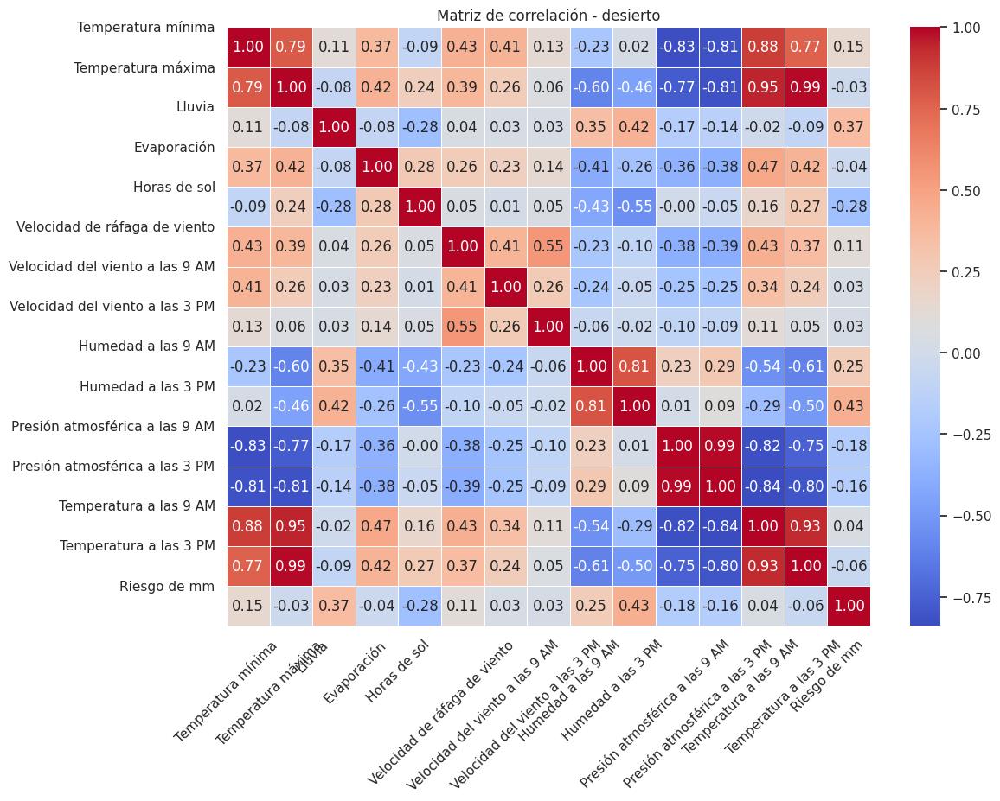

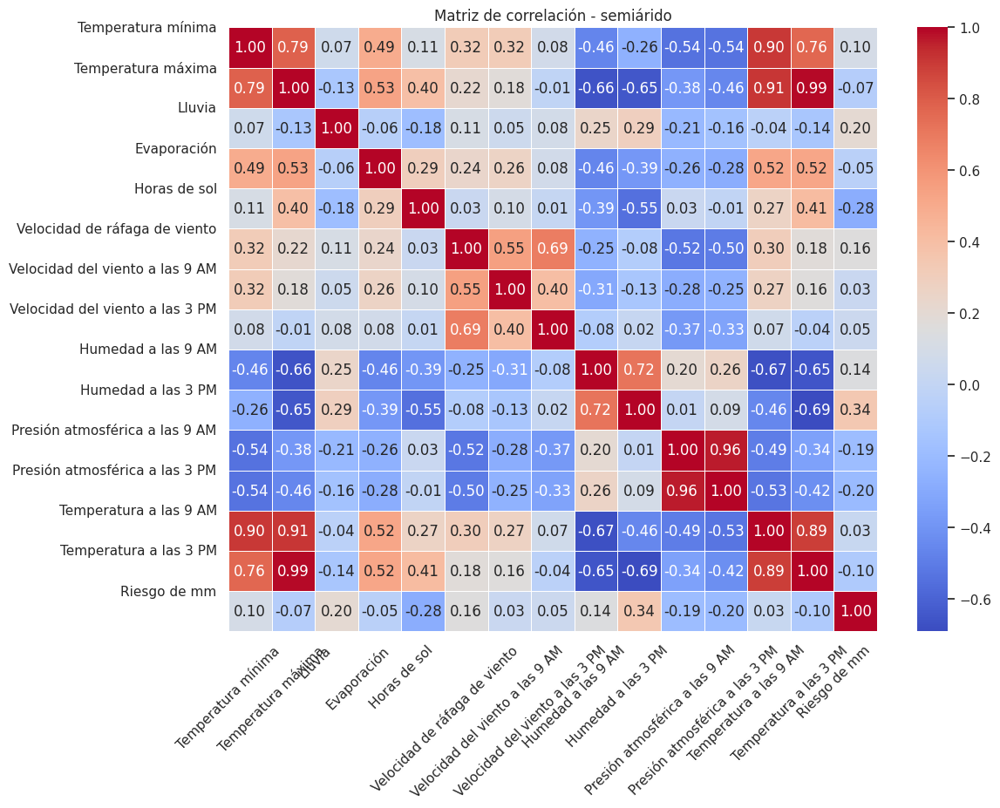

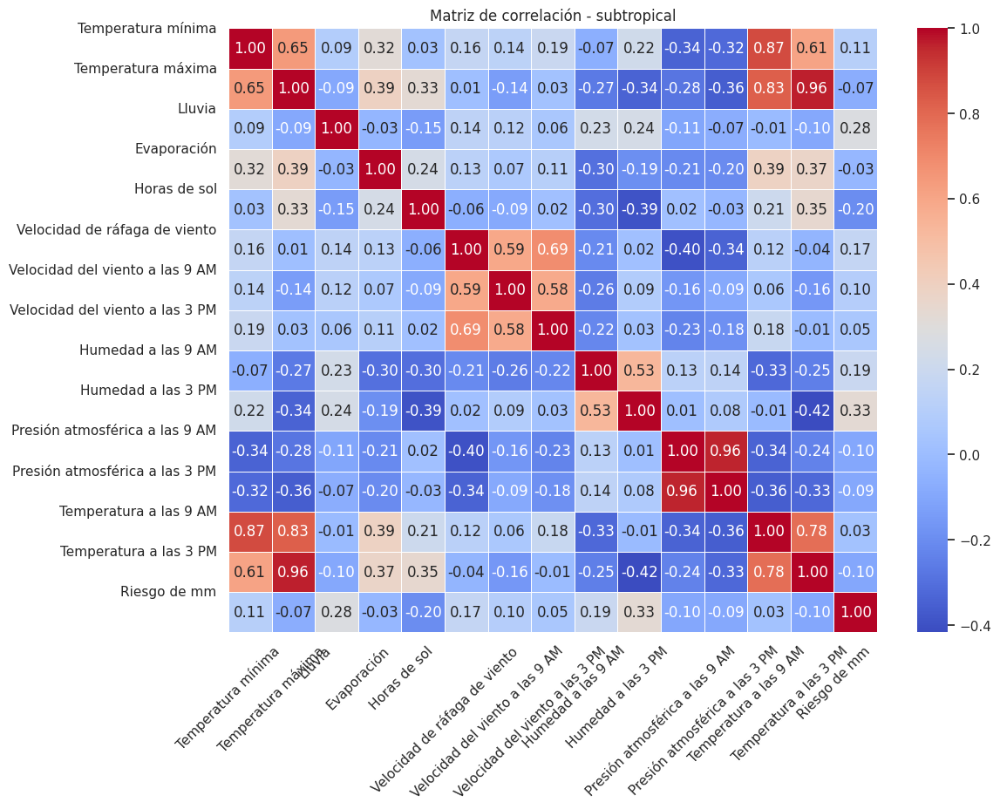

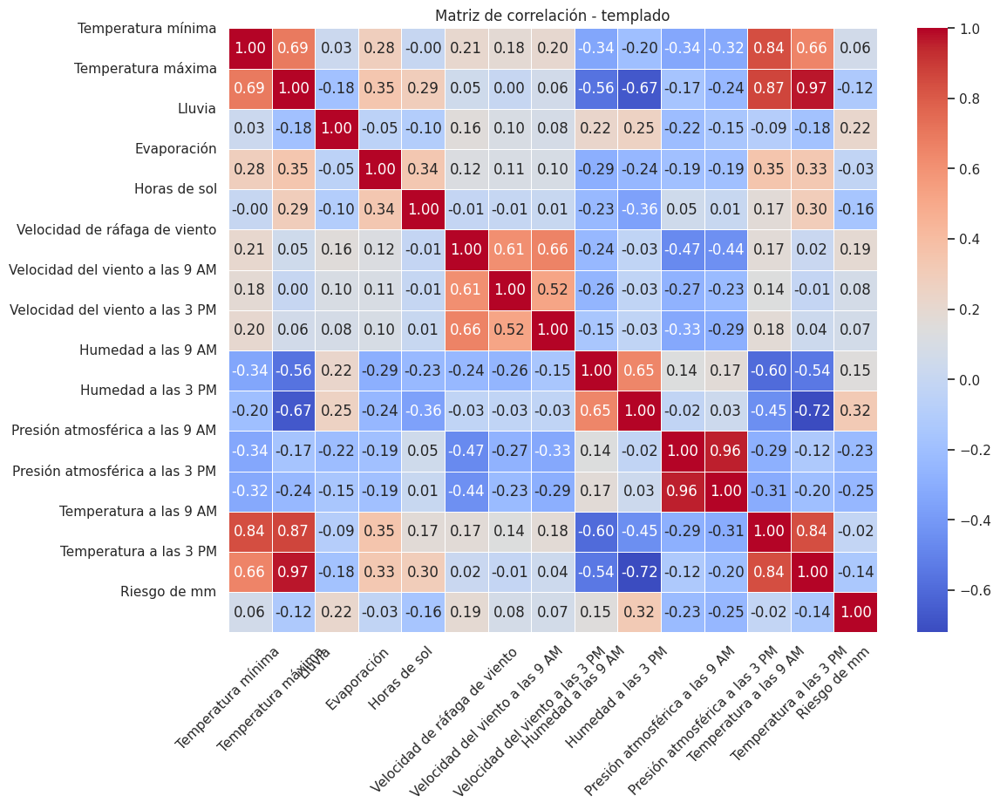

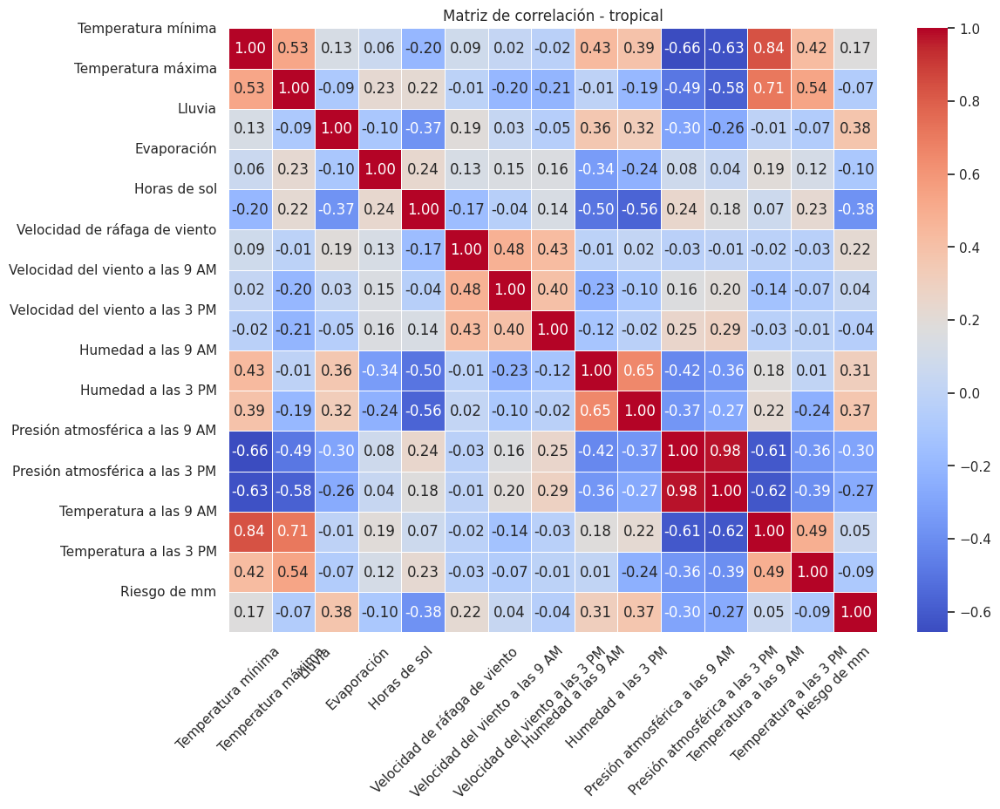

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Definir las variables meteorológicas en español
variables = ['mintemp', 'maxtemp', 'rainfall', 'evaporation', 'sunshine', 'windgustspeed',
             'windspeed9am', 'windspeed3pm', 'humidity9am', 'humidity3pm', 'pressure9am',
             'pressure3pm', 'temp9am', 'temp3pm', 'risk_mm']

# Calcular y visualizar la matriz de correlación para cada tipo de clima
for weather_type, group in df.groupby('tipo_clima'):
    correlation_matrix = group[variables].corr()

    # Configurar el tamaño de la figura para la matriz de correlación
    plt.figure(figsize=(12, 9))

    # Crear el mapa de calor con anotaciones
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

    # Configurar título y etiquetas de los ejes
    plt.title(f'Matriz de correlación - {weather_type}')
    plt.xticks(ticks=range(len(variables)), labels=['Temperatura mínima', 'Temperatura máxima', 'Lluvia', 'Evaporación', 'Horas de sol',
                 'Velocidad de ráfaga de viento', 'Velocidad del viento a las 9 AM', 'Velocidad del viento a las 3 PM',
                 'Humedad a las 9 AM', 'Humedad a las 3 PM', 'Presión atmosférica a las 9 AM',
                 'Presión atmosférica a las 3 PM', 'Temperatura a las 9 AM', 'Temperatura a las 3 PM', 'Riesgo de mm'], rotation=45)
    plt.yticks(ticks=range(len(variables)), labels=['Temperatura mínima', 'Temperatura máxima', 'Lluvia', 'Evaporación', 'Horas de sol',
                 'Velocidad de ráfaga de viento', 'Velocidad del viento a las 9 AM', 'Velocidad del viento a las 3 PM',
                 'Humedad a las 9 AM', 'Humedad a las 3 PM', 'Presión atmosférica a las 9 AM',
                 'Presión atmosférica a las 3 PM', 'Temperatura a las 9 AM', 'Temperatura a las 3 PM', 'Riesgo de mm'])

    plt.show()


In [ ]:
import pandas as pd


variables = ['mintemp', 'maxtemp', 'temp9am', 'temp3pm', 'rainfall', 'evaporation',
             'sunshine', 'windgustspeed', 'windspeed9am', 'windspeed3pm', 'humidity9am',
             'humidity3pm', 'pressure9am', 'pressure3pm', 'cloud9am', 'cloud3pm', 'risk_mm', 'raintoday',  'raintomorrow']

variables_interes = ['humidity3pm', 'raintomorrow', 'temp3pm', 'windspeed3pm']

# Agrupar por weather_type y calcular las top 7 correlaciones por cada variable de interés
for tipo_clima, group in df.groupby('tipo_clima'):
    correlation_matrix = group[variables].corr()

    # Obtener las correlaciones de las variables de interés para el weather_type actual
    correlations_interes = correlation_matrix.loc[variables_interes]

    # Mostrar las top 7 correlaciones para cada variable de interés y weather_type
    print(f"Tipo de clima: {tipo_clima}")
    for var in variables_interes:
        top_corr = correlations_interes.loc[var].drop(var).sort_values(ascending=False)[:7]  # Excluye la propia variable y toma el top 7
        print(f"Top 7 correlaciones para '{var}':")
        print(top_corr)
        print()  # Espacio entre resultados
    print("=====================================")


Tipo de clima: desierto
Top 7 correlaciones para 'humidity3pm':
humidity9am     0.808618
raintoday       0.543714
raintomorrow    0.496947
risk_mm         0.432832
rainfall        0.424243
cloud9am        0.352422
cloud3pm        0.330508
Name: humidity3pm, dtype: float64

Top 7 correlaciones para 'raintomorrow':
risk_mm        0.621694
humidity3pm    0.496947
raintoday      0.346526
humidity9am    0.297152
rainfall       0.288715
cloud3pm       0.249423
cloud9am       0.222412
Name: raintomorrow, dtype: float64

Top 7 correlaciones para 'temp3pm':
maxtemp          0.990617
temp9am          0.933392
mintemp          0.768336
evaporation      0.417867
windgustspeed    0.365806
sunshine         0.265977
windspeed9am     0.244089
Name: temp3pm, dtype: float64

Top 7 correlaciones para 'windspeed3pm':
windgustspeed    0.547676
windspeed9am     0.264732
evaporation      0.142470
mintemp          0.133399
temp9am          0.109229
maxtemp          0.060976
temp3pm          0.052855
Name: win

En climas desérticos, la humedad a las 3 pm ("huidity3pm") está fuertemente correlacionada con la humedad a las 9 am (0,81) y moderadamente correlacionada con la probabilidad de precipitación mañana (0,50) y hoy (0,49). En climas semiáridos, la humedad a las 3 p. m. está fuertemente correlacionada con la humedad a las 9 a. m. (0,72) y moderadamente correlacionada con la probabilidad de precipitación mañana (0,44) y la nubosidad a las 9 a. m. (0,41). En climas subtropicales, la humedad a las 3 p. m. se correlaciona significativamente con la humedad a las 9 a. m. (0,53) y la probabilidad de lluvia mañana (0,45). En climas templados, la humedad a las 3 pm está altamente correlacionada con la humedad a las 9 am (0,65) y moderadamente correlacionada con la probabilidad de lluvia mañana (0,41). En un clima tropical, la humedad a las 3 p. m. está fuertemente correlacionada con la humedad a las 9 a. m. (0,65), la nubosidad a las 3 p. m. (0,52) y las 9 a. m. (0,50) y la probabilidad de precipitación mañana (0,50).

##Convertir Tipo de Clima

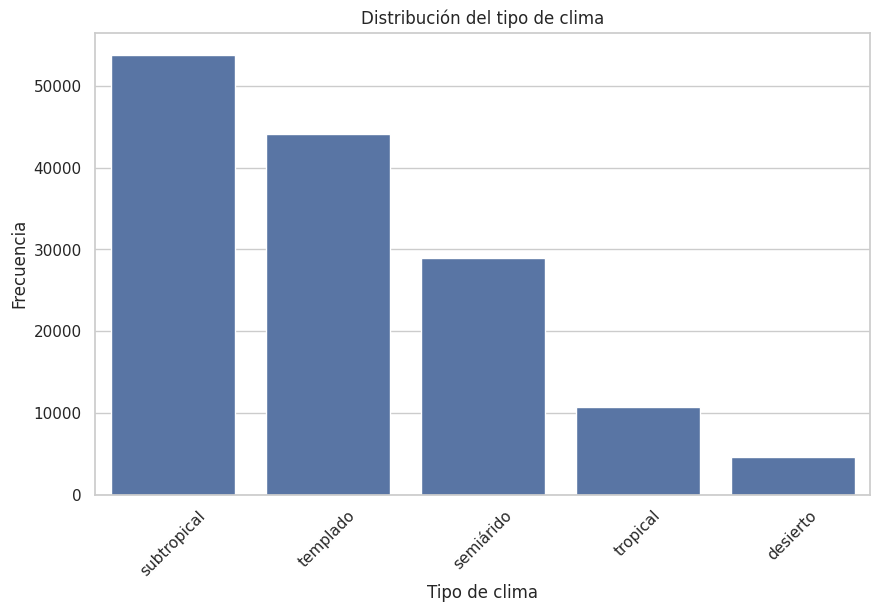

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='tipo_clima', order=df['tipo_clima'].value_counts().index)
plt.xlabel('Tipo de clima')
plt.ylabel('Frecuencia')
plt.title('Distribución del tipo de clima')
plt.xticks(rotation=45)
plt.show()

Tenemos 5 variables, donde claramente tenemos una inclinación a subtropical, y un bajo descenso hacia desierto.

Se ha transformado la variable de tipo de clima para ser trabajada posteriormente

In [ ]:
encoder = OneHotEncoder(sparse=False)

weather_type_encoded = encoder.fit_transform(df[['tipo_clima']])

weather_type_encoded_df = pd.DataFrame(weather_type_encoded, columns=encoder.get_feature_names_out(['tipo_clima']))

df = pd.concat([df, weather_type_encoded_df], axis=1)

df.drop('tipo_clima', axis=1, inplace=True)


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


##Estandarización y normalización

Se ha estandarizado y normalizado los datos, para equiparar las escalas de los datos, de '0' a '1'. Y así obtener mediciones más precisas

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Suponiendo que df ya está definido y contiene las columnas mencionadas
# Si no, cargar el dataframe
# df = pd.read_csv('ruta/a/tu/dataframe.csv')

# Copiar las columnas originales antes de transformarlas
df['humidity3pm_standardized'] = df['humidity3pm'].copy()
df['humidity9am_normalized'] = df['humidity9am'].copy()
df['cloud3pm_normalized'] = df['cloud3pm'].copy()
df['cloud9am_normalized'] = df['cloud9am'].copy()


# Estandarizar 'humidity3pm'
scaler_standard = StandardScaler()
df['humidity3pm_standardized'] = scaler_standard.fit_transform(df[['humidity3pm_standardized']])

# Normalizar 'humidity9am'
scaler_minmax = MinMaxScaler()
df['humidity9am_normalized'] = scaler_minmax.fit_transform(df[['humidity9am_normalized']])

# Normalizar 'cloud3pm'
df['cloud3pm_normalized'] = scaler_minmax.fit_transform(df[['cloud3pm_normalized']])


df['cloud9am_normalized'] = scaler_minmax.fit_transform(df[['cloud9am_normalized']])


#Fase 4: Modelamiento de los datos

Se centra en seleccionar y aplicar diversas técnicas de modelado para encontrar patrones y relaciones en los datos.

##Modelos supervisados

Los modelos supervisados se distinguen de los no supervisados, porque poseen datos de entrenamiento y de prueba.

In [ ]:
df = df.drop('date', axis=1)

In [ ]:
df['location'] = le.fit_transform(df['location'])

La variable dates se ha eliminado, ya que no es necesaria.Asimismo con la variable locación.

##Regresión

Los modelos de regresión nos servirá para predecir la variable humedad a las 3pm para que se relacionaba con la variable de nubosidad a las 9am y humedad a las 9am de tal manera de tener una correlación media entre las dos variables, perfecta para evitar redundancias.

Recordemos la relacion entre humedad de las 3 pm con humedad a las 9am y nubosidad a las 9am.


**humedad a las 9am  = 0.660071**

**nubosidad a las 9am = 0.314565**

La regresión lineal es un modelo simple que requiere datos ya normalizados, como son humedad a las 9am y nubosidad a las 9am(que ya tiene una distribucion normal y con una escala similar). Tambien humedad a las 3pm ha sido trabajada, sin embargo posee una distribución normal.

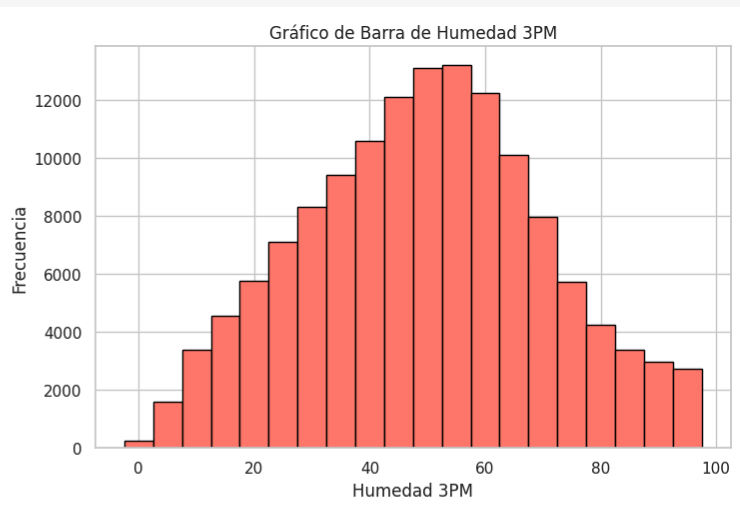

##Regresión lineal

In [ ]:
X = df[['humidity9am_normalized', 'cloud9am']]
y = df['humidity3pm_standardized']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = LinearRegression()

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'MSE: %.2f' % mse)
print(f'R^2 Score: %.2f' %r2)

print('Coeficientes del modelo:', model.coef_)
print('Intersección del modelo: %.2f' %model.intercept_)


MSE: 0.54
R^2 Score: 0.46
Coeficientes del modelo: [3.26906885 0.04932077]
Intersección del modelo: -2.47


El anterior código sirve para crear un modelo de regresión lineal que ayude a predecir la humedad a las 3pm, basándose en la humedad y nubosidad de las 9am, obteniendo resultados r2 de 0.46, lo que quiere decir que el modelo explica el 46% de la variabilidad en la humedad a las 3pm, siendo una capacidad predictiva mediana


###Arbol de decisión

In [ ]:
X = df[['humidity9am', 'cloud9am']]
y = df['humidity3pm']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = DecisionTreeRegressor(random_state=42)

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'MSE: %.2f' % mse)
print(f'R^2 Score: %.2f' %r2)

print('Importancia de las características: ', model.feature_importances_)


MSE: 226.22
R^2 Score: 0.46
Importancia de las características:  [0.94527535 0.05472465]


El anterior código sirve para crear el modelo de arbol de decision para predecir la humedad a las 3pm, la diferencia con el modelo de regresión lineal es que el arbol puede capturar relaciones no lineales entre variables.
Con los resultados puede saberse que la humedad a las 9am tiene una mayor importancia en la predicción a comparación con la nubosidad a las 9am

##Clasificación

Los modelos de clasificación nos sirven para predecir categorías o clases, en este caso KNN

Se quiere predecir si se lloverá el día siguiente para recalendarizar los viajes, para eso se ha usado la variable 'lloverá mañana',esta variable esta sesgada hacia la clase negativ (que no lloverá), es por eso que se ha decidido usar KNN, que es robusta frente a variables con muchos outliers y que no siguen una distribución normal. Sin embargo, no es una decisión que nos librará del desbalanceo natural de la variable. Por lo que se debe evaluar cautelosamente.

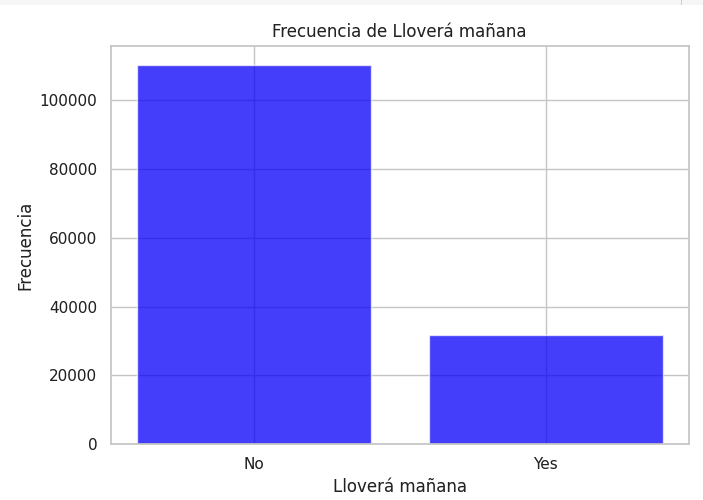

###KNN

In [ ]:
X = df[['raintoday', 'humidity3pm_standardized', 'humidity9am_normalized']]
y = df['raintomorrow']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

knn = KNeighborsClassifier(n_neighbors=5)

knn.fit(X_train, y_train)

y_pred = knn.predict(X_test)


accuracy_knn = accuracy_score(y_test, y_pred)
recall_knn = recall_score(y_test, y_pred)
f1_knn = f1_score(y_test, y_pred)

print("Accuracy: %.2f" % accuracy_knn)
print("Recall: %.2f" % recall_knn)
print("F1: %.2f" % f1_knn)

Accuracy: 0.81
Recall: 0.41
F1: 0.49


In [ ]:
cm = confusion_matrix(y_test, y_pred)

classes = ['No llueve', 'Llueve']

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)

<Figure size 800x600 with 0 Axes>

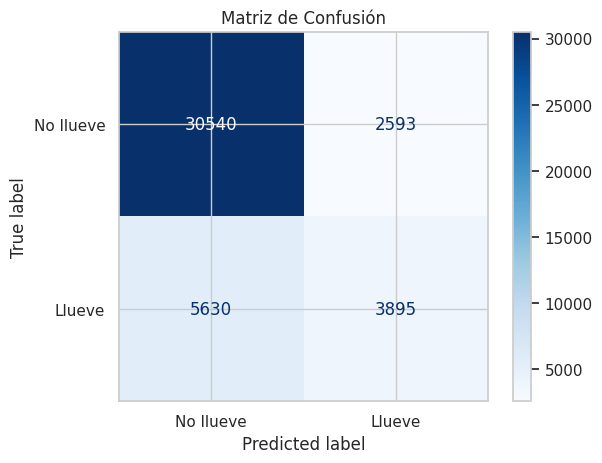


Classification Report:
              precision    recall  f1-score   support

   No llueve       0.84      0.92      0.88     33133
      Llueve       0.60      0.41      0.49      9525

    accuracy                           0.81     42658
   macro avg       0.72      0.67      0.68     42658
weighted avg       0.79      0.81      0.79     42658



In [ ]:
matriz = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
disp.plot(cmap=plt.cm.Blues)
plt.title('Matriz de Confusión')
plt.show()

accuracy_knn = accuracy_score(y_test, y_pred)
recall_knn = recall_score(y_test, y_pred)
f1_knn = f1_score(y_test, y_pred)

print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names = classes))

Se puede observar que la variable tiene una exactitud de 81 y predice valores verdaderos mas que erroneos. Sin embargo, el desbalanceo nos obstruye de la visión real de los datos

###Arbol de clasificación

In [ ]:
X = df[['raintoday', 'humidity3pm', 'humidity9am']]
y = df['raintomorrow']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

clf = DecisionTreeClassifier(random_state=42)

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

accuracy_dt = accuracy_score(y_test, y_pred)
recall_dt = recall_score(y_test, y_pred)
f1_dt = f1_score(y_test, y_pred)

print("Accuracy: %.2f" % accuracy_dt)
print("Recall: %.2f" % recall_dt)
print("F1: %.2f" % f1_dt)

print("\nClassification Report:")
target_names = ['No llueve', 'Llueve']
print(classification_report(y_test, y_pred, target_names = target_names))

Accuracy: 0.82
Recall: 0.37
F1: 0.48

Classification Report:
              precision    recall  f1-score   support

   No llueve       0.84      0.95      0.89     33133
      Llueve       0.67      0.37      0.48      9525

    accuracy                           0.82     42658
   macro avg       0.75      0.66      0.68     42658
weighted avg       0.80      0.82      0.80     42658



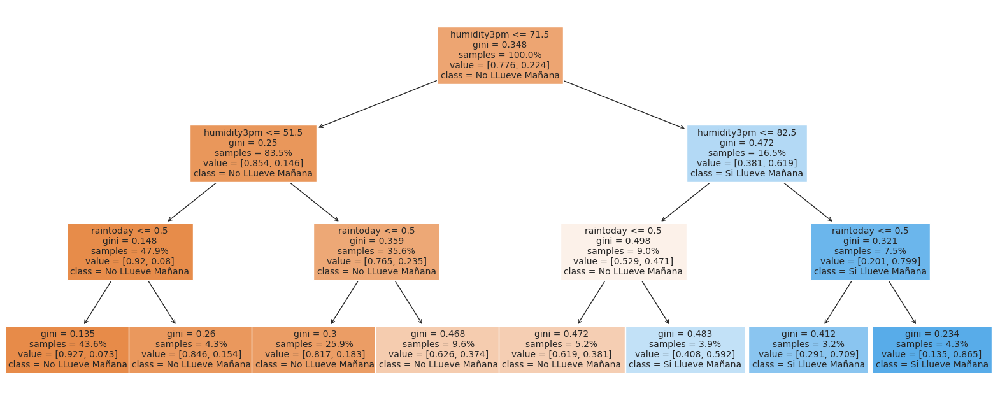

In [ ]:
single_decision = DecisionTreeClassifier(max_depth=3)
single_decision.fit(X, y)
plt.figure(figsize=(20, 8))
plot_tree(single_decision, feature_names=X.columns, class_names=['No LLueve Mañana', 'Si Llueve Mañana'], filled=True, proportion=True, fontsize=10)
plt.show()

###Modelos no supervisados

###KMEANS 1

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


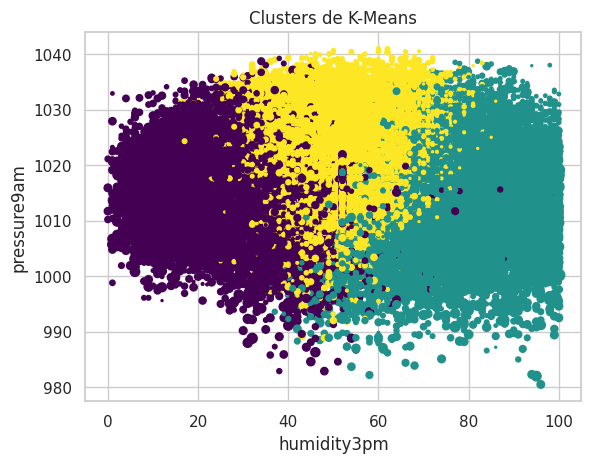

KMeans1 - Silhouette Score: 0.23


In [ ]:
kmeans1 = KMeans(n_clusters=3, random_state=0)
clusters1 = kmeans1.fit_predict(df)

df['Cluster1'] = clusters1

plt.scatter(df['humidity3pm'], df['pressure9am'], df['windspeed9am'],c=df['Cluster1'], cmap='viridis')
plt.xlabel('humidity3pm')
plt.ylabel('pressure9am')
plt.title('Clusters de K-Means')
plt.show()

silhouette_kmeans1 = silhouette_score(df[['humidity3pm','pressure9am','windspeed9am']], df['Cluster1'])

print(f'KMeans1 - Silhouette Score: {silhouette_kmeans1:.2f}')

###KMEANS 2

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


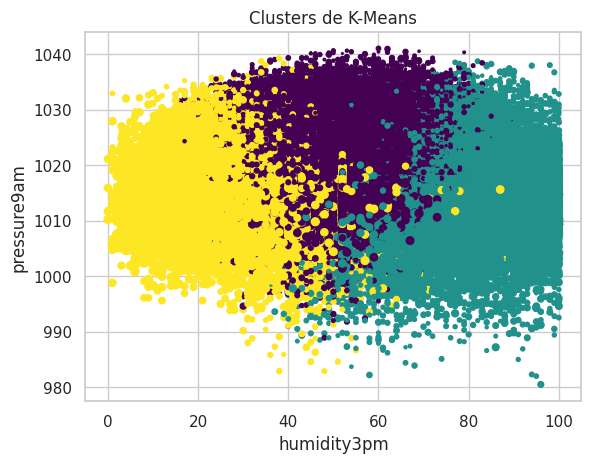

KMeans2 - Silhouette Score: 0.23


In [ ]:
kmeans2 = KMeans(n_clusters=3, random_state=0)
clusters2 = kmeans2.fit_predict(df)

df['Cluster2'] = clusters2

plt.scatter(df['humidity3pm'], df['pressure9am'], df['temp9am'],c=df['Cluster2'], cmap='viridis')
plt.xlabel('humidity3pm')
plt.ylabel('pressure9am')
plt.title('Clusters de K-Means')
plt.show()

silhouette_kmeans2 = silhouette_score(df[['humidity3pm','pressure9am','temp9am']], df['Cluster2'])

print(f'KMeans2 - Silhouette Score: {silhouette_kmeans2:.2f}')

###KMEANS3

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


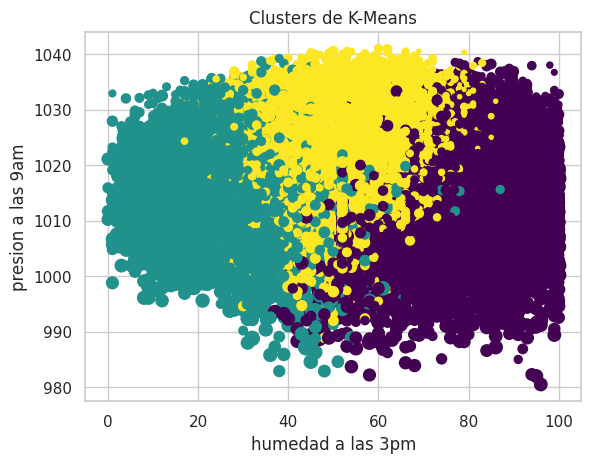

KMeans3 - Silhouette Score: 0.24


In [ ]:
kmeans3 = KMeans(n_clusters=3, random_state=0)
clusters3 = kmeans3.fit_predict(df)

df['Cluster3'] = clusters3

plt.scatter(df['humidity3pm'], df['pressure9am'], df['windgustspeed'],c=df['Cluster3'], cmap='viridis')
plt.xlabel('humedad a las 3pm')
plt.ylabel('presion a las 9am')
plt.title('Clusters de K-Means')
plt.show()

silhouette_kmeans3 = silhouette_score(df[['humidity3pm','pressure3pm','windgustspeed']], df['Cluster3'])

print(f'KMeans3 - Silhouette Score: {silhouette_kmeans3:.2f}')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


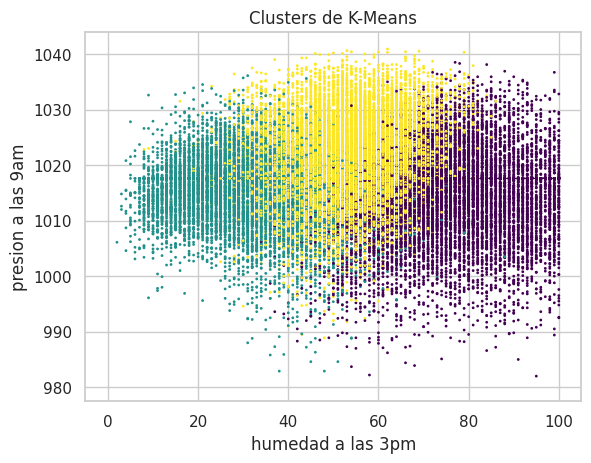

KMeans4 - Silhouette Score: 0.25


In [ ]:
kmeans4 = KMeans(n_clusters=3, random_state=0)
clusters3 = kmeans4.fit_predict(df)

df['Cluster3'] = clusters3

plt.scatter(df['humidity3pm'], df['pressure9am'], df['tipo_clima_templado'],c=df['Cluster3'], cmap='viridis')
plt.xlabel('humedad a las 3pm')
plt.ylabel('presion a las 9am')
plt.title('Clusters de K-Means')
plt.show()

silhouette_kmeans4 = silhouette_score(df[['humidity3pm','pressure3pm','tipo_clima_templado']], df['Cluster3'])

print(f'KMeans4 - Silhouette Score: {silhouette_kmeans4:.2f}')

##Insights

Como se puede apreciar en el anterior modelo, esta relacionado con el KPI N2, existen 3 cluster con diferentes colores que se pueden explicar de la siguiente manera

Cluster de color Morado: Este cluster tiene puntos con una alta humedad y diversas presiones, esto en relación a los retrasos durante los viajes pueden ser consideradas condiciones desfavorables, asociados con niebla, lluvias o condiciones atmosféricas inestables.

Cluster de color Verde: Este cluster tiene puntos con una humedad intermedia y presiones moderadas, sugiriendo condiciones climáticas favorables para una baja tasa de retrasos debido a que las condiciones son mas predecibles y seguras.

Cluster de color Amarillo: Este cluster tiene puntos con una baja humedad y una alta gama de presiones atmosféricas, las condiciones pueden ser medianamente ideales para realizar vuelos, pero en caso de que las presiones varíen demasiado, podrían generarse corrientes de aire inestables para el vuelo

Se puede observar que la variable tipo_clima_templado, ha mejorado en un punto el puntaje de Silhouette, esto indica que el tipo de clima, agrupa relaciones que no se conocía, y se puede aprovechar para tener más precisión a la hora de predecir la humedad de las 3pm, considerando el sector donde se esta.

#Fase 5: Evalucion del modelo.

¿Se cumplen los objetivos definidos?
Determinar estrategias y aconsejar a la empresa para generar valor a través del proyecto

In [ ]:
print("Comparación de Modelos Supervisados:")
print(f"Regresión lineal - R2: {r2:.2f}, MSE: {mse:.2f}")
print(f"Decision Tree - Precisión: {accuracy_dt:.2f}, Recall: {recall_dt:.2f}, F1-Score: {f1_dt:.2f}")
print(f"KNN - Precisión: {accuracy_knn:.2f}, Recall: {recall_knn:.2f}, F1-Score: {f1_knn:.2f}")

print("\nComparación de Modelos No supervisados:")
print(f"KMeans1 - Silhouette Score: {silhouette_kmeans1:.2f}")
print(f"KMeans2 - Silhouette Score: {silhouette_kmeans2:.2f}")
print(f"KMeans3 - Silhouette Score: {silhouette_kmeans3:.2f}")
print(f"KMeans4 - Silhouette Score: {silhouette_kmeans4:.2f}")

In [ ]:
modelo_regresion = ['Regresión Lineal']
r2_scores = [r2]
mse_scores = [mse]

modelos_clasificación = ['KNN', 'Arbol de clasificación']
accuracy_scores = [accuracy_knn, accuracy_dt]
recall_scores = [recall_knn, recall_dt]
f1_scores = [f1_knn, f1_dt]

modelos_no_supervisados = ['KMeans1', 'KMeans2', 'KMeans3','KMeans4']
silhouette_scores = [silhouette_kmeans1, silhouette_kmeans2, silhouette_kmeans3,silhouette_kmeans4]

fig, axs = plt.subplots(2, 3, figsize=(18, 10))

axs[0, 0].bar(modelo_regresion, r2_scores, color='b', alpha=0.7)
axs[0, 0].set_ylabel('R2 Score')
axs[0, 0].set_title('R2 Score Modelo Regresión')

axs[0, 1].bar(modelo_regresion, mse_scores, color='g', alpha=0.7)
axs[0, 1].set_ylabel('MSE')
axs[0, 1].set_title('MSE Modelo Regresión')

axs[0, 2].bar(modelos_clasificación, accuracy_scores, color='b', alpha=0.7)
axs[0, 2].set_ylabel('Accuracy')
axs[0, 2].set_title('Accuracy de Modelos de Clasificación')

axs[1, 0].bar(modelos_clasificación, recall_scores, color='g', alpha=0.7)
axs[1, 0].set_ylabel('Recall')
axs[1, 0].set_title('Recall de Modelos de Clasificación')

axs[1, 1].bar(modelos_clasificación, f1_scores, color='purple', alpha=0.7)
axs[1, 1].set_ylabel('F1-score')
axs[1, 1].set_title('F1-score de Modelos de Clasificación')

axs[1, 2].bar(modelos_no_supervisados, silhouette_scores, color='orange', alpha=0.7)
axs[1, 2].set_ylabel('Silhouette Score')
axs[1, 2].set_title('Silhouette Score de Modelos No Supervisados')

plt.tight_layout()
plt.show()

Según vemos en la comparativa podemos concluir que nuestro modelo de "Arbol de clasificación" seria el mejor a utilizar, esto ya que a pesar de que su "precisión" es menor que el modelo de "KNN" posee un recall mayor lo que significa que el ratio de verdaderos positivos tiende a clasificarse mejor.

KNN trata a todas las características por igual.Sin embargo el árbol de clasificación usa las características más relevantes y trabaja con ellas, asi como la robustez frente a características irreleventas o ruidosas, o su uso con variables en estado "base", sin normalizar o estandarizar

Además, el KPI que mas urge completar y significa mas valor al negocio es, "Tasa de viajes recalendarizados", para recalendarizar debe haber un motivo de fuerza mayor, en este caso el riesgo de accidente que puede haber en un globo aereoestático.